# **Credit EDA & Credit Score Calculation with Python**

**PROBLEM STATEMENT:**

The project aims to conduct a comprehensive exploratory data analysis (EDA) and deep analysis of a dataset containing basic customer details and extensive credit-related information. The goal is to create valuable features, calculate a hypothetical credit score, and uncover meaningful patterns, anomalies, and insights within the data. This involves:

**Thorough EDA** to understand the data's structure, characteristics, distributions, and relationships.

**Feature Engineering** to create new, informative features that can enhance the credit score calculation.

**Hypothetical Credit Score** Calculation using a defined methodology inspired by FICO scores.

**Insightful Analysis** to reveal factors influencing creditworthiness and guide potential risk mitigation strategies.

**BASIC METRICS FOR ANALYSIS:**
The following basic metrics will be used to assess and analyze the dataset:

**Age:** Represents the age of the person.

**Annual Income:** Represents the annual income of the person.

**Monthly Inhand Salary:** Represents the monthly base salary of the person.

**Number of Bank Accounts:** Represents the number of bank accounts a person holds.

**Number of Credit Cards:** Represents the number of other credit cards held by a person.

**Interest Rate:** Represents the interest rate on the credit card.

**Number of Loans:** Represents the number of loans taken from the bank.

**Delay from Due Date:** Represents the average number of days delayed from the payment date.

**Number of Delayed Payments:** Represents the average number of payments delayed by a person.

**Changed Credit Limit:** Represents the percentage change in the credit card limit.

**Number of Credit Inquiries:** Represents the number of credit card inquiries.

**Outstanding Debt:** Represents the remaining debt to be paid (in USD).

**Credit Utilization Ratio:** Represents the utilization ratio of the credit card.

**Credit History Age:** Represents the age of credit history of the person.

**Total EMI per Month:** Represents the monthly EMI payments (in USD).

**Amount Invested Monthly:** Represents the monthly amount invested by the customer (in USD).

**Monthly Balance:** Represents the monthly balance amount of the customer (in USD).

These metrics will be analyzed to understand their distributions, relationships, and potential impact on the hypothetical credit score.

**KEY OBJECTIVES:**

**Data Cleaning and Preprocessing:** Ensure the dataset is clean and ready for analysis by handling missing values, correcting data types, and addressing inconsistencies or outliers.

**Exploratory Data Analysis:** Conduct a detailed EDA to uncover patterns, relationships, and insights within the data.

**Feature Engineering:** Create new features that can provide additional value in the credit score calculation.

**Credit Score Calculation:** Develop a methodology to calculate a hypothetical credit score, experimenting with different weighting schemes and normalizing the scores.

**Insight Generation:** Identify key factors influencing creditworthiness and provide actionable insights for risk mitigation strategies.

**1. EDA(Exploratory Data Analysis):**

**Data Understanding:**



*   Load the dataset and understand the structure and types of data in each column.
*   Check for missing values, data types, and unique values in each column.


**Data Cleaning:**


*   Handle missing values appropriately (e.g., imputation, deletion).
*   Convert data types where necessary.
*   Address any inconsistencies or outliers.

**Descriptive Statistics:**

* Calculate basic statistics (mean, median, mode, standard deviation) for numerical columns.
* Summarize categorical data (frequency distribution).

**Visualization:**

* Use histograms, box plots, and density plots to understand distributions.
* Use scatter plots and correlation matrices to understand relationships between variables.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Importing dataset
data = pd.read_csv('Credit_score.csv')
data.head()

<ipython-input-2-3dccaf5bb343>:2: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Credit_score.csv')


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231


**OBSERVING THE DATASET:**
Now, we are going to observe the dataset, handle missing values and prepare the data for generating valuable insights

In [3]:
# shape of data
print("The shape of data is:", data.shape)

The shape of data is: (100000, 27)


In [4]:
# information of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 27 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

**MISSING VALUES:**

Our dataset has 100000 rows with 27 different columns. Few coluumns are not having 100000 non-null values, which indicates that there are missing values in the dataset.

**CHANGING DATA TYPES:** There are few columns which are supposed to be either int or float but they are present in object data type. So, we are going to convert them.

In [5]:

# Convert to numeric where necessary and handle non-numeric values
data['Age'] = pd.to_numeric(data['Age'], errors='coerce')
data['Annual_Income'] = pd.to_numeric(data['Annual_Income'].str.replace(',', ''), errors='coerce')
data['Num_of_Loan'] = pd.to_numeric(data['Num_of_Loan'], errors='coerce')
data['Num_of_Delayed_Payment'] = pd.to_numeric(data['Num_of_Delayed_Payment'], errors='coerce')
data['Changed_Credit_Limit'] = pd.to_numeric(data['Changed_Credit_Limit'].str.replace('%', ''), errors='coerce')
data['Outstanding_Debt'] = pd.to_numeric(data['Outstanding_Debt'].str.replace(',', ''), errors='coerce')
data['Credit_History_Age'] = data['Credit_History_Age'].str.extract('(\d+)', expand=False).astype(float)
data['Amount_invested_monthly'] = pd.to_numeric(data['Amount_invested_monthly'].str.replace(',', ''), errors='coerce')
data['Monthly_Balance'] = pd.to_numeric(data['Monthly_Balance'].str.replace(',', ''), errors='coerce')

# Handle missing values
data['Name'].fillna('Unknown', inplace=True)
data['Monthly_Inhand_Salary'].fillna(data['Monthly_Inhand_Salary'].median(), inplace=True)
data['Type_of_Loan'].fillna('Unknown', inplace=True)
data['Num_of_Delayed_Payment'].fillna(data['Num_of_Delayed_Payment'].median(), inplace=True)
data['Num_Credit_Inquiries'].fillna(data['Num_Credit_Inquiries'].median(), inplace=True)
data['Credit_History_Age'].fillna(data['Credit_History_Age'].median(), inplace=True)
data['Amount_invested_monthly'].fillna(data['Amount_invested_monthly'].median(), inplace=True)
data['Monthly_Balance'].fillna(data['Monthly_Balance'].median(), inplace=True)

# Verify data types and missing values
print(data.dtypes)
print(data.isnull().sum())


ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                         float64
SSN                          object
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
dtype: object
ID            

In [6]:
# Mean Imputation Example
data['Age'].fillna(data['Age'].mean(), inplace=True)
data['Annual_Income'].fillna(data['Annual_Income'].mean(), inplace=True)
data['Num_of_Loan'].fillna(data['Num_of_Loan'].mean(), inplace=True)
data['Changed_Credit_Limit'].fillna(data['Changed_Credit_Limit'].mean(), inplace=True)
data['Outstanding_Debt'].fillna(data['Outstanding_Debt'].mean(), inplace=True)

In [7]:
data.isna().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0


In [8]:
data['Payment_Behaviour'].fillna(data['Payment_Behaviour'].mode()[0], inplace=True)
data['Total_EMI_per_month'].fillna(data['Total_EMI_per_month'].mean(), inplace=True)
data['Payment_of_Min_Amount'].fillna(data['Payment_of_Min_Amount'].mode()[0], inplace=True)
data['Credit_Utilization_Ratio'].fillna(data['Credit_Utilization_Ratio'].mean(), inplace=True)
data['Credit_Mix'].fillna(data['Credit_Mix'].mode()[0], inplace=True)

In [9]:
data.isna().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0


In [10]:
# Descriptive Statistics
data.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,110.934505,1.785790e+05,4029.084964,17.091280,22.47443,72.466040,2.780339,21.068780,29.373010,10.389025,27.326780,1426.503700,32.285173,17.969540,1403.118217,189.690637,400.274514
std,672.167190,1.391611e+06,2961.363540,117.404834,129.05741,466.422621,60.987261,14.860104,215.671804,6.718136,191.293766,1149.203715,5.116875,7.935336,8306.041270,191.527772,210.834653
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,0.000000,0.007760
25%,25.000000,2.006286e+04,1792.084167,3.000000,4.00000,8.000000,2.000000,10.000000,9.000000,5.420000,3.000000,571.650000,28.052567,12.000000,30.306660,77.017414,271.839534
50%,34.000000,4.097204e+04,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.560000,6.000000,1175.880000,32.305784,18.000000,69.249473,128.954538,336.472111
75%,44.000000,8.352124e+04,5371.525000,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.660000,9.000000,1933.430000,36.496663,24.000000,161.224249,220.039055,463.502161
max,8698.000000,2.419806e+07,15204.633330,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,33.000000,82331.000000,1977.326102,1602.040519


In [11]:
pd.options.display.float_format = '{:.2f}'.format

In [12]:
data.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.00,821-00-0265,Scientist,19114.12,1824.84,3,...,4.00,_,809.98,26.82,22.00,No,49.57,80.42,High_spent_Small_value_payments,312.49
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.00,821-00-0265,Scientist,19114.12,3093.74,3,...,4.00,Good,809.98,31.94,18.00,No,49.57,118.28,Low_spent_Large_value_payments,284.63
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500.00,821-00-0265,Scientist,19114.12,3093.74,3,...,4.00,Good,809.98,28.61,22.00,No,49.57,81.70,Low_spent_Medium_value_payments,331.21
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.00,821-00-0265,Scientist,19114.12,3093.74,3,...,4.00,Good,809.98,31.38,22.00,No,49.57,199.46,Low_spent_Small_value_payments,223.45
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.00,821-00-0265,Scientist,19114.12,1824.84,3,...,4.00,Good,809.98,24.80,22.00,No,49.57,41.42,High_spent_Medium_value_payments,341.49


In [13]:
data.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00
mean,110.93,178578.96,4029.08,17.09,22.47,72.47,2.78,21.07,29.37,10.39,27.33,1426.50,32.29,17.97,1403.12,189.69,400.27
std,672.17,1391610.62,2961.36,117.40,129.06,466.42,60.99,14.86,215.67,6.72,191.29,1149.20,5.12,7.94,8306.04,191.53,210.83
min,-500.00,7005.93,303.65,-1.00,0.00,1.00,-100.00,-5.00,-3.00,-6.49,0.00,0.23,20.00,0.00,0.00,0.00,0.01
25%,25.00,20062.86,1792.08,3.00,4.00,8.00,2.00,10.00,9.00,5.42,3.00,571.65,28.05,12.00,30.31,77.02,271.84
50%,34.00,40972.04,3093.74,6.00,5.00,13.00,3.00,18.00,14.00,9.56,6.00,1175.88,32.31,18.00,69.25,128.95,336.47
75%,44.00,83521.24,5371.52,7.00,7.00,20.00,5.00,28.00,18.00,14.66,9.00,1933.43,36.50,24.00,161.22,220.04,463.50
max,8698.00,24198062.00,15204.63,1798.00,1499.00,5797.00,1496.00,67.00,4397.00,36.97,2597.00,4998.07,50.00,33.00,82331.00,1977.33,1602.04


In [14]:
# Identify and convert ages in days to years
data.loc[data['Age'] > 100, 'Age'] = data['Age'] / 365

# Verify the conversion
print(data['Age'].describe())

count   100000.00
mean        26.58
std         51.43
min       -500.00
25%         22.00
50%         32.00
75%         41.00
max        100.00
Name: Age, dtype: float64


In [15]:
# Identify rows with negative ages and set them to NaN
data.loc[data['Age'] < 0, 'Age'] = None

# Replace NaN values with the mean age
data['Age'].fillna(data['Age'].mean(), inplace=True)

# Verify the conversion
print(data['Age'].describe())

count   100000.00
mean        31.28
std         12.89
min          0.28
25%         23.00
50%         32.00
75%         41.00
max        100.00
Name: Age, dtype: float64


**Identifying Outliers:**
Next, we are going to check for the outliers present in the dataset.

In [16]:
# Identify outliers using IQR
def find_outliers(column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = data[(data[column] < (Q1 - 1.5 * IQR)) | (data[column] > (Q3 + 1.5 * IQR))]
    return outliers

# Columns to check for outliers
numeric_columns = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                   'Num_Credit_Card','Interest_Rate', 'Num_of_Loan',
                   'Num_of_Delayed_Payment', 'Changed_Credit_Limit','Num_Credit_Inquiries',
                   'Outstanding_Debt','Credit_Utilization_Ratio',
                   'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance']

# Find and print outliers for each numeric column
for column in numeric_columns:
    outliers = find_outliers(column)
    print(f'Outliers in {column}:')
    print(outliers[[column]].describe())
    print('\n')

Outliers in Age:
         Age
count   5.00
mean   96.80
std     2.49
min    95.00
25%    95.00
50%    95.00
75%    99.00
max   100.00


Outliers in Annual_Income:
       Annual_Income
count        1042.00
mean     11498739.38
std       7495241.04
min        178793.92
25%       4493877.25
50%      11856320.50
75%      18025749.00
max      24198062.00


Outliers in Monthly_Inhand_Salary:
       Monthly_Inhand_Salary
count                4365.00
mean                12394.55
std                  1279.31
min                 10742.12
25%                 11263.85
50%                 12020.65
75%                 13470.42
max                 15204.63


Outliers in Num_Bank_Accounts:
       Num_Bank_Accounts
count            1315.00
mean              896.90
std               513.33
min                18.00
25%               464.00
50%               885.00
75%              1333.50
max              1798.00


Outliers in Num_Credit_Card:
       Num_Credit_Card
count          2271.00
mean           

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


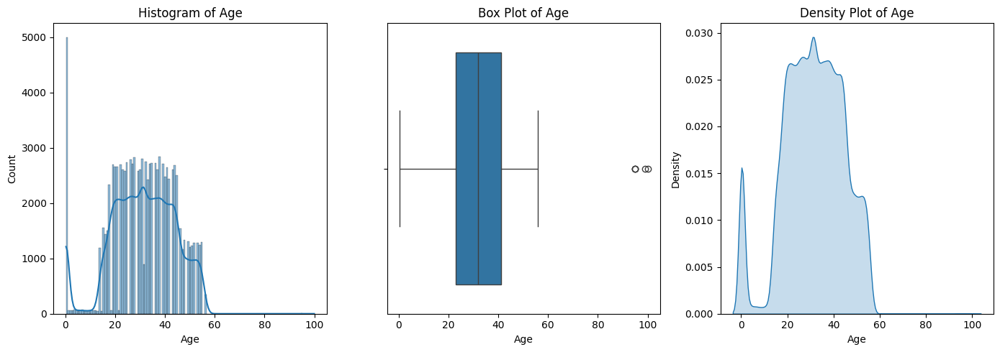

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


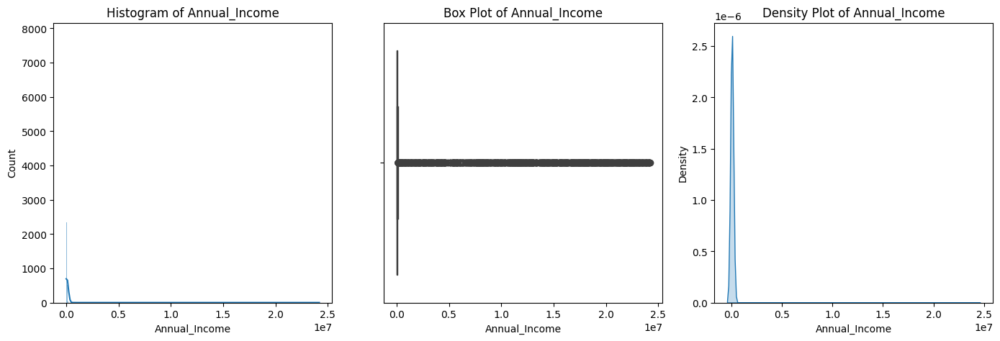

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


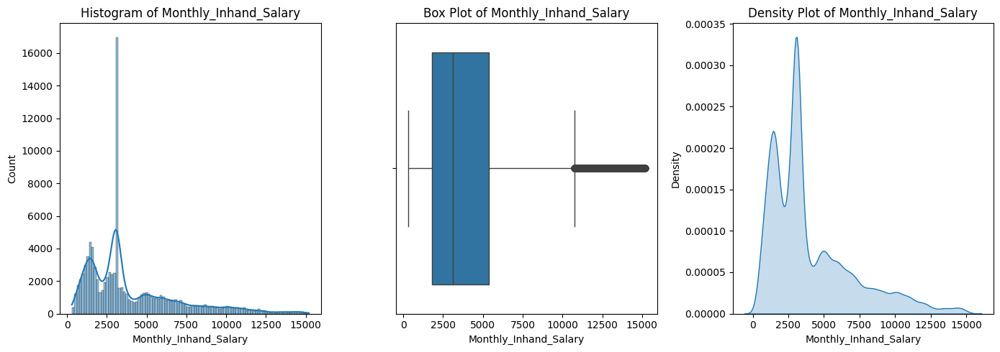

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


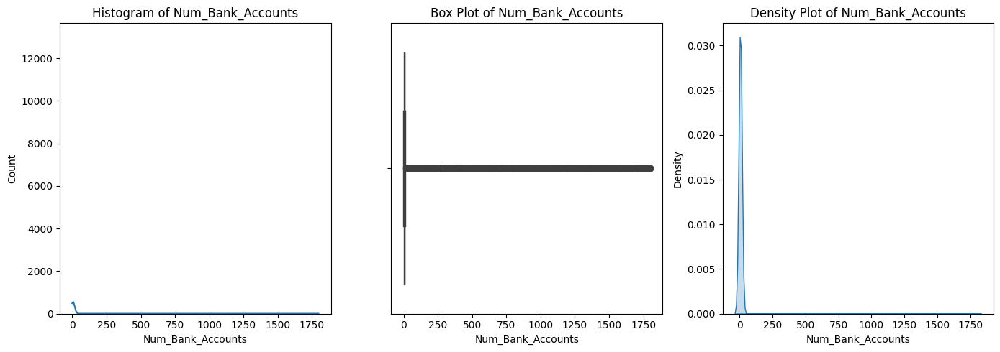

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


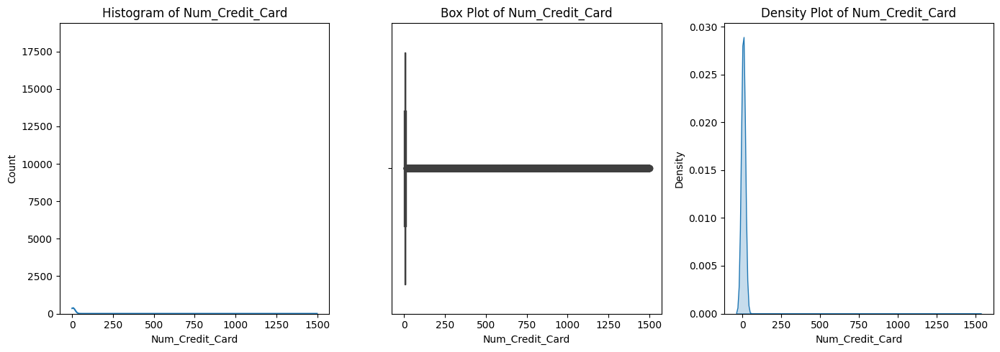

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


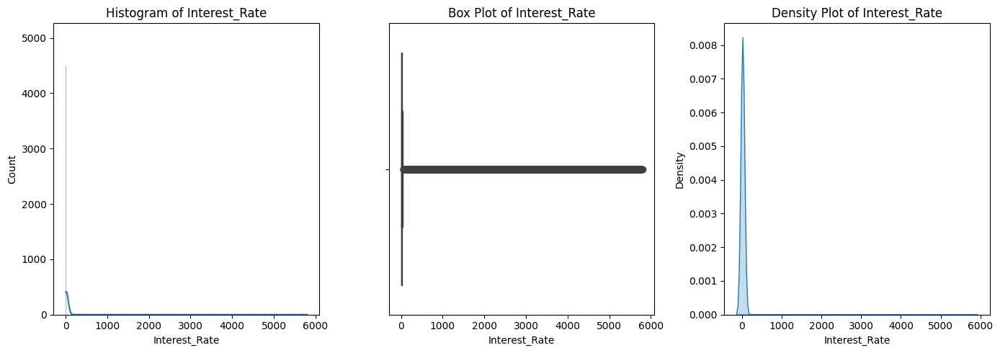

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


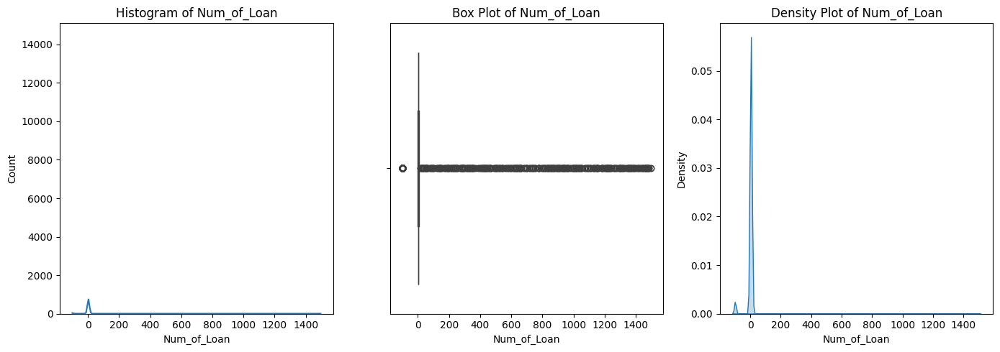

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


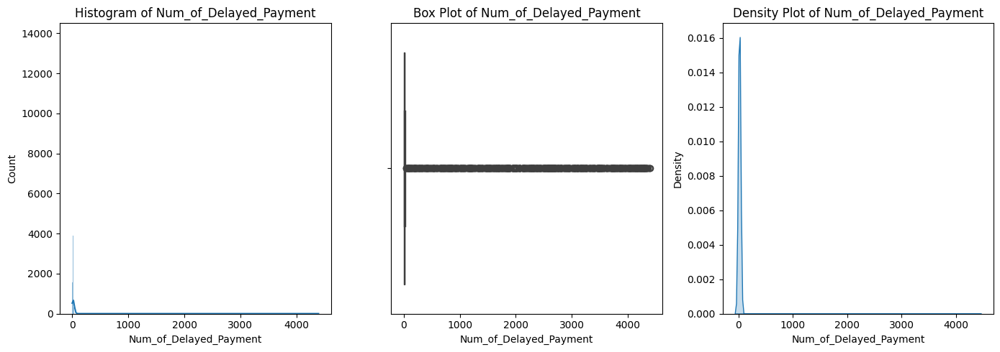

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


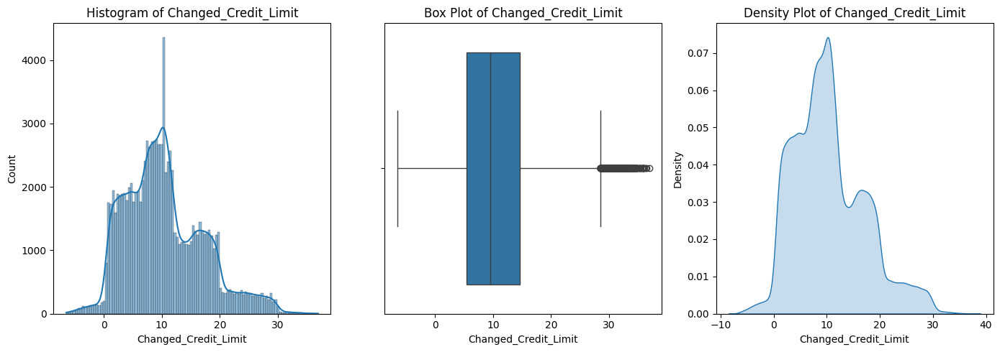

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


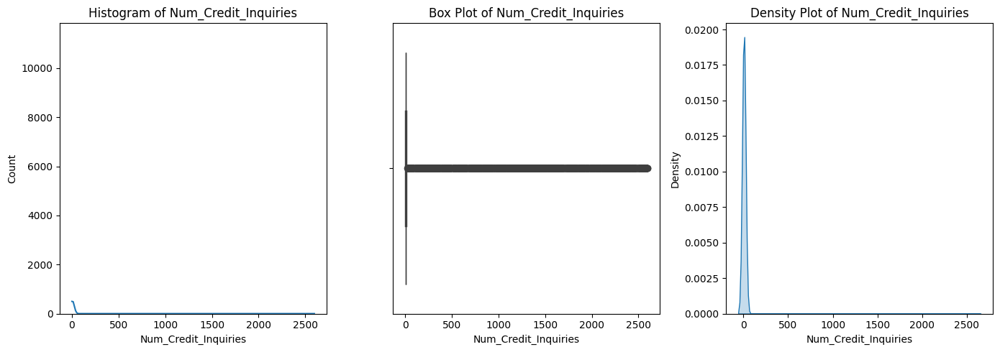

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


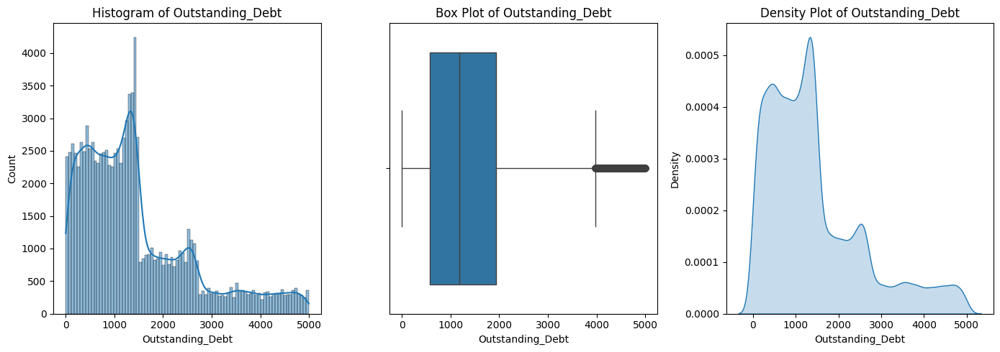

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


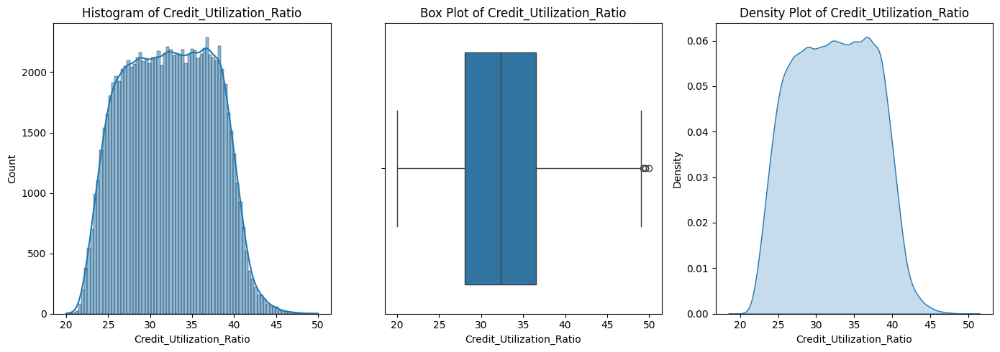

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


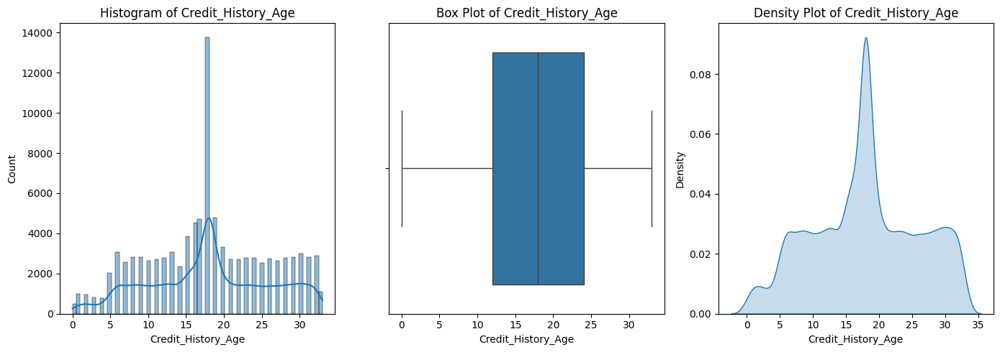

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


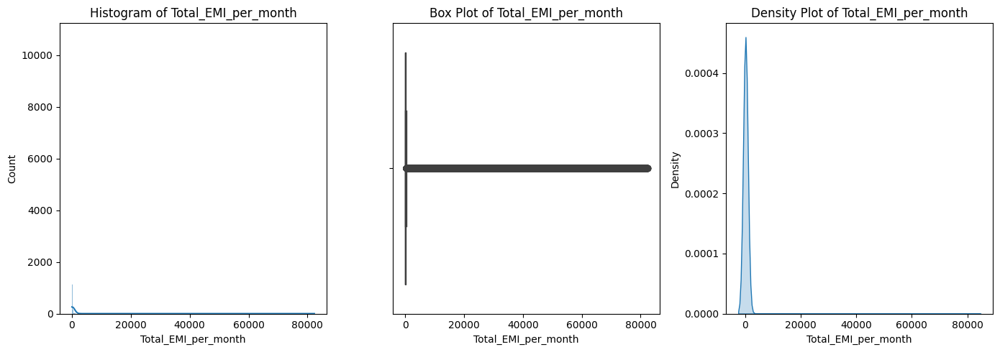

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


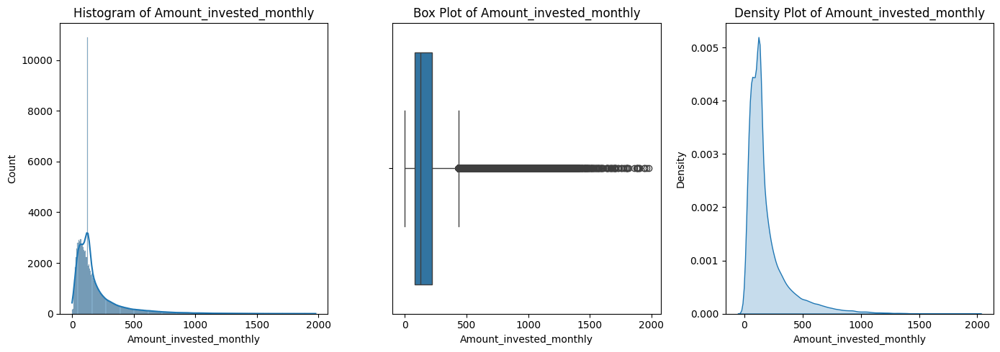

<ipython-input-17-bfc7ac4c1490>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], shade=True)


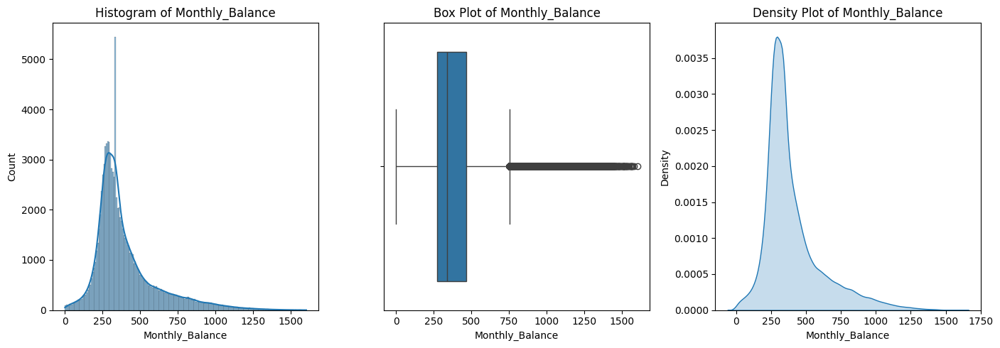

In [17]:
# Visualize distributions using histograms, box plots, and density plots
# Columns to check for outliers
import matplotlib.pyplot as plt
import seaborn as sns
numeric_columns = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                   'Num_Credit_Card','Interest_Rate', 'Num_of_Loan',
                   'Num_of_Delayed_Payment', 'Changed_Credit_Limit','Num_Credit_Inquiries',
                   'Outstanding_Debt','Credit_Utilization_Ratio',
                   'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance']
for column in numeric_columns:
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram of {column}')

    plt.subplot(1, 3, 2)
    sns.boxplot(x=data[column])
    plt.title(f'Box Plot of {column}')

    plt.subplot(1, 3, 3)
    sns.kdeplot(data[column], shade=True)
    plt.title(f'Density Plot of {column}')

    plt.tight_layout()
    plt.show()


In [18]:
# taking few columns as the outliers and substituting mean value instead the outlier value
# rest for all the columns where we can see outliers, they are actually not outliers can be the values with such variations.
def identify_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (column < lower_bound) | (column > upper_bound)

def substitute_outliers_with_mean(df,column_name):
    # Calculate the mean of the column
    mean_value = df[column_name].mean()

    # Identify outliers
    outliers = identify_outliers_iqr(df[column_name])

    # Replace outliers with the mean value
    df.loc[outliers, column_name] = mean_value

substitute_outliers_with_mean(data,'Num_Bank_Accounts')
substitute_outliers_with_mean(data,'Num_Credit_Card')
substitute_outliers_with_mean(data,'Num_of_Loan')
substitute_outliers_with_mean(data,'Num_Credit_Inquiries')

<ipython-input-18-2ff112ba4f66>:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '17.09128' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[outliers, column_name] = mean_value
<ipython-input-18-2ff112ba4f66>:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '22.47443' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[outliers, column_name] = mean_value


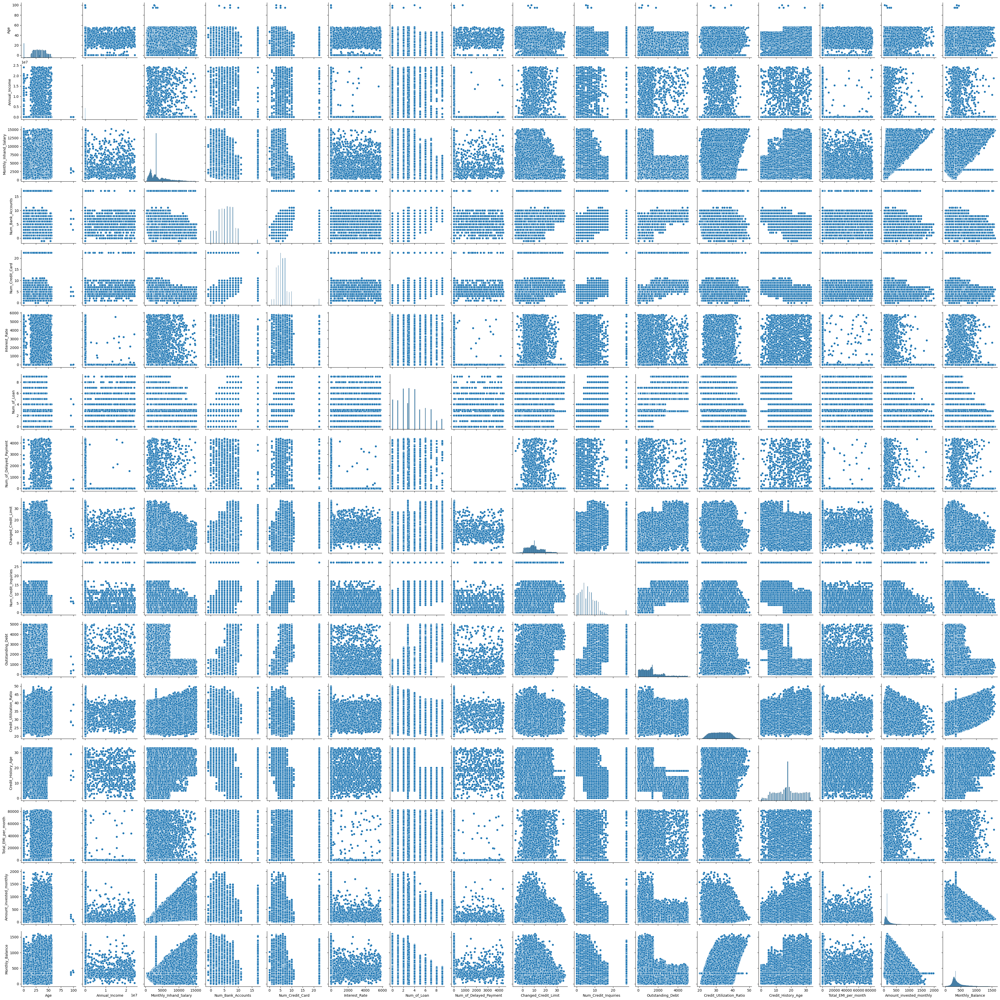

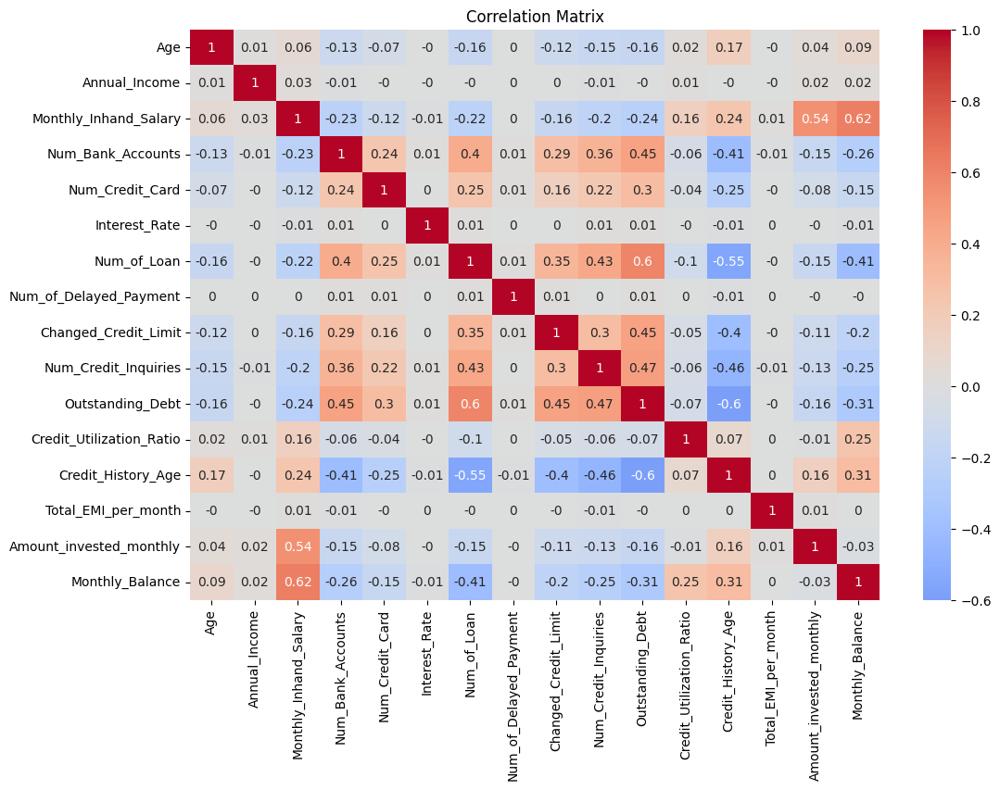

In [19]:
# Visualize relationships using scatter plots and correlation matrix
sns.pairplot(data[numeric_columns])
plt.show()

# Correlation matrix
correlation_matrix = round(data[numeric_columns].corr(),2)
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

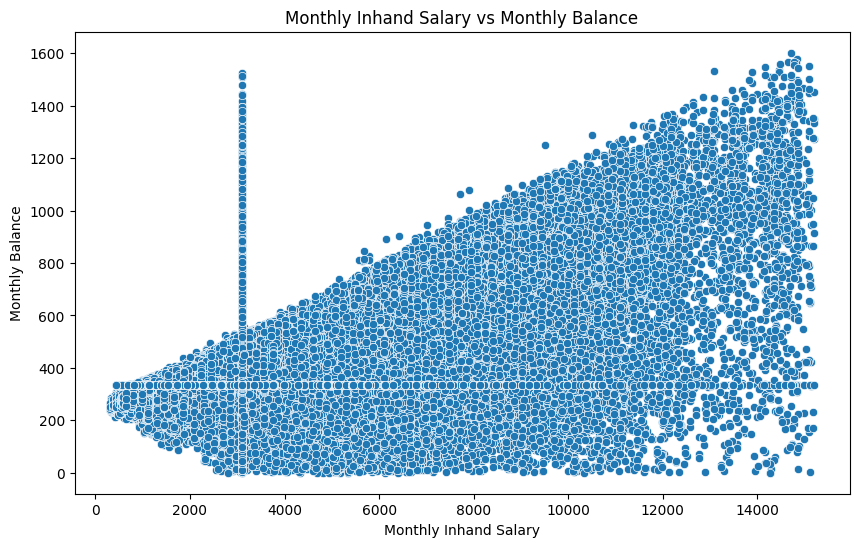

In [20]:
# Based on above correlation matrix going to plot some graphs to visualize the impact.
# Plot: Monthly Inhand Salary vs Monthly Balance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Monthly_Inhand_Salary', y='Monthly_Balance', data=data)
plt.title('Monthly Inhand Salary vs Monthly Balance')
plt.xlabel('Monthly Inhand Salary')
plt.ylabel('Monthly Balance')
plt.show()

**Insights:**

We observe a positive upward trend between monthly inhand salary and monthly balance, indicating a strong correlation between the two. This suggests that as a person's earnings increase, they tend to save more effectively.

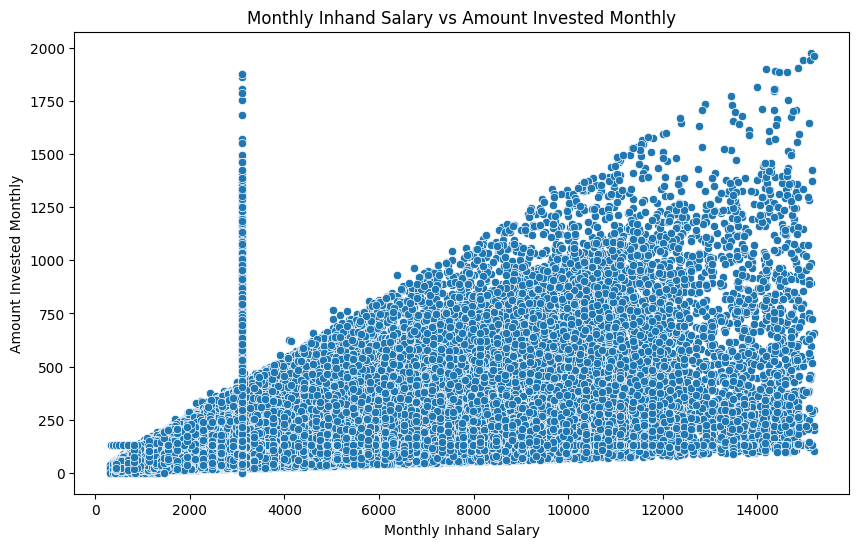

In [21]:
# Plot: Monthly Inhand Salary vs Amount Invested Monthly
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Monthly_Inhand_Salary', y='Amount_invested_monthly', data=data)
plt.title('Monthly Inhand Salary vs Amount Invested Monthly')
plt.xlabel('Monthly Inhand Salary')
plt.ylabel('Amount Invested Monthly')
plt.show()

**Insights:**

We observe a positive upward trend between monthly inhand salary and amount invested monthly, indicating a strong correlation between the two. This suggests that as a person's earnings increase, they tend to invest more effectively.

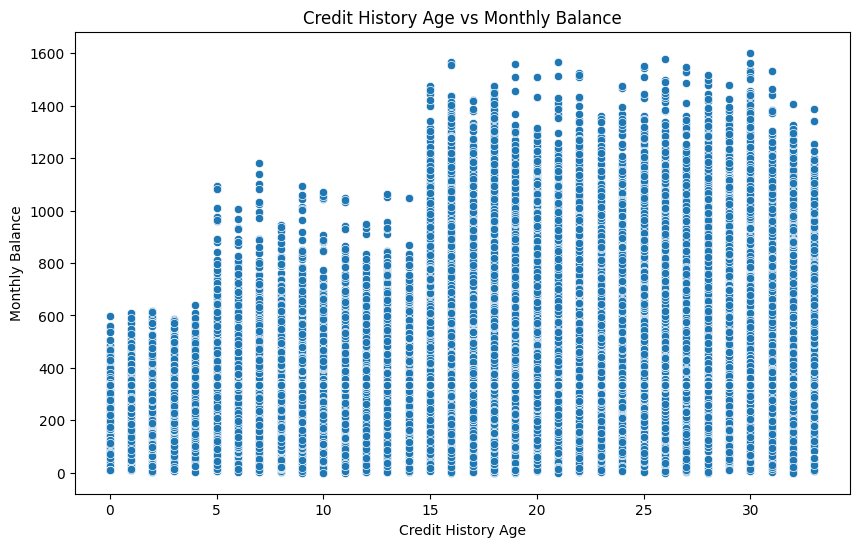

In [22]:
# Plot: Credit History Age vs Monthly Balance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Credit_History_Age', y='Monthly_Balance', data=data)
plt.title('Credit History Age vs Monthly Balance')
plt.xlabel('Credit History Age')
plt.ylabel('Monthly Balance')
plt.show()

**Insights:**

The data reveals a clear trend in the relationship between credit history age and average monthly balance:

* **Early Credit History (0-5 years):** Individuals with a credit history age of 0-5 years tend to have a relatively low average monthly balance, typically up to ₹1,000. This could indicate that individuals with a shorter credit history might be in the early stages of financial stability, possibly focusing on building credit or managing initial financial obligations.

* **Developing Credit History (5-15 years):** For those with a credit history age of 5-15 years, the average monthly balance slightly increases, ranging between ₹1,000 and ₹1,100. This suggests that as individuals build a longer credit history, they might begin to improve their financial management, leading to modest increases in savings or available funds.

* **Established Credit History (15-35 years):** Individuals with a credit history age of 15-35 years show a significant jump in their average monthly balance, which lies between ₹1,400 and ₹1,600. This indicates that a longer credit history correlates with greater financial stability and higher savings, possibly due to more effective financial habits, increased income, or better access to credit resources.

**Overall Insight:**
As credit history age increases, there is a noticeable improvement in average monthly balance, reflecting that individuals with longer credit histories tend to be more financially secure and capable of maintaining higher savings. This trend underscores the importance of building and maintaining a solid credit history for long-term financial well-being.

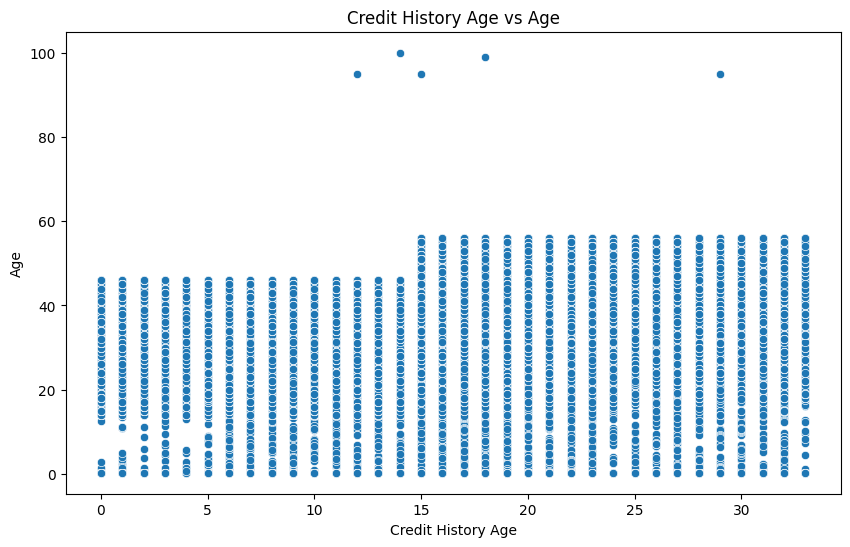

In [23]:
# Plot: Credit History Age vs Age
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Credit_History_Age', y='Age', data=data)
plt.title('Credit History Age vs Age')
plt.xlabel('Credit History Age')
plt.ylabel('Age')
plt.show()

**Insights:**


The data provides interesting insights into the relationship between credit history age and the average age of individuals:

* **Credit History Age 0-14 Years:**
The average age of individuals in this group is around 50 years. This suggests that people in their mid-life are likely to have a shorter credit history, possibly due to late entry into formal credit systems, delayed financial independence, or significant life events that impacted their financial journey.
* **Credit History Age 15-34 Years:** The average age in this group rises to around 58 years, indicating that older individuals typically have a longer credit history. This is expected, as they have had more time to accumulate and manage credit over the years.
* **Extreme Cases:**
     * There are some extreme data points where individuals up to around 99 years old have a credit history age between 12-20 years. These outliers suggest that even at an advanced age, some individuals have relatively short credit histories, possibly due to late entry into the credit system, changes in financial behavior, or specific circumstances such as emigration or re-entry into the financial system after a period of absence.
     * Notably, there is an instance where a 98-year-old individual has a credit history of 30 years. This indicates that some individuals maintain an active financial presence well into advanced age, with a long and stable credit history.

**Overall Insight:**
The data reveals that while the average credit history length tends to increase with age, there are significant variations and outliers. Some older individuals have shorter credit histories, while others maintain a robust credit presence even in their later years. This highlights the diversity in financial behavior and life circumstances across different age groups, emphasizing that credit history is influenced by a combination of age, life events, and financial decisions.

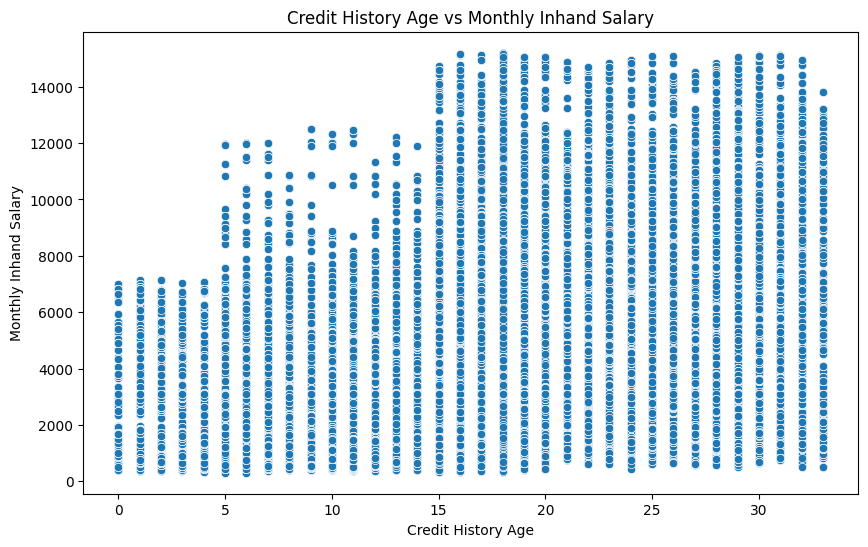

In [24]:
# Plot: Credit History Age vs Monthly Inhand Salary
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Credit_History_Age', y='Monthly_Inhand_Salary', data=data)
plt.title('Credit History Age vs Monthly Inhand Salary')
plt.xlabel('Credit History Age')
plt.ylabel('Monthly Inhand Salary')
plt.show()

**Insights:**

The data reveals a clear progression in monthly inhand salary as credit history age increases:

* **Credit History Age 0-4 Years:** Individuals with a credit history age of 0-4 years typically have a monthly inhand salary ranging between ₹600 and ₹7,000. This suggests that those with a shorter credit history may be at an earlier stage in their careers or have limited experience with credit, which could correlate with lower income levels.
* **Credit History Age 5-14 Years:** For those with a credit history age of 5-14 years, the monthly inhand salary increases to a range of ₹7,000 to ₹12,000. This indicates that as individuals accumulate more credit history, they also tend to move into higher income brackets, likely reflecting career advancement and increased financial stability.
* **Credit History Age 15-34 Years:** Individuals with a credit history age of 15-34 years show even higher monthly inhand salaries, ranging from ₹12,000 to ₹16,000. This trend highlights that with a longer credit history, individuals are more likely to have established careers, higher earnings, and greater financial security.

**Overall Insight:**
As credit history age increases, there is a significant upward trend in monthly inhand salary. This suggests that a longer credit history often corresponds with higher income levels, reflecting greater career stability and financial growth. It highlights the importance of building and maintaining a long credit history as it appears to be associated with higher earning potential and financial success.











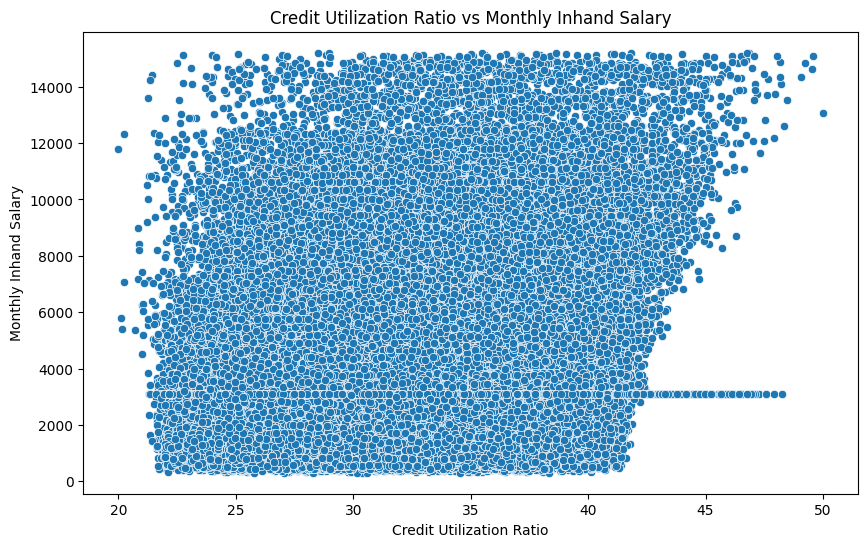

In [25]:
# Plot: Credit Utilization Ratio vs Monthly Inhand Salary
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Credit_Utilization_Ratio', y='Monthly_Inhand_Salary', data=data)
plt.title('Credit Utilization Ratio vs Monthly Inhand Salary')
plt.xlabel('Credit Utilization Ratio')
plt.ylabel('Monthly Inhand Salary')
plt.show()

**Insighs:**
The data indicates that across the entire range of monthly inhand salary, the credit utilization ratio consistently falls between 22% and 42%. This provides several key insights:

* **Stable Credit Utilization Behavior:** Despite varying income levels, individuals tend to maintain a relatively consistent credit utilization ratio within a moderate range. This suggests a general trend of responsible credit usage, where most people, regardless of their earnings, use a similar proportion of their available credit.
* **Financial Prudence Across Income Levels:** The fact that the credit utilization ratio does not significantly increase or decrease with higher or lower monthly inhand salaries suggests that individuals across different income brackets are equally cautious in managing their credit. It indicates a widespread understanding of the importance of maintaining a balanced credit utilization ratio, which is crucial for maintaining or improving credit scores.
Potential Indicator of Financial Stability:
* A credit utilization ratio between 22% and 42% is generally considered healthy, as it indicates that individuals are not overextending themselves financially. This consistent ratio across various income levels may reflect a broader trend of financial stability and prudent credit management among the population.

**Overall Insight:**
The consistent credit utilization ratio of 22% to 42% across different monthly inhand salary ranges suggests that individuals, regardless of their income, generally exhibit similar and responsible credit usage. This stability in credit utilization indicates a widespread understanding of maintaining a healthy credit profile and reflects a level of financial discipline across various income brackets.








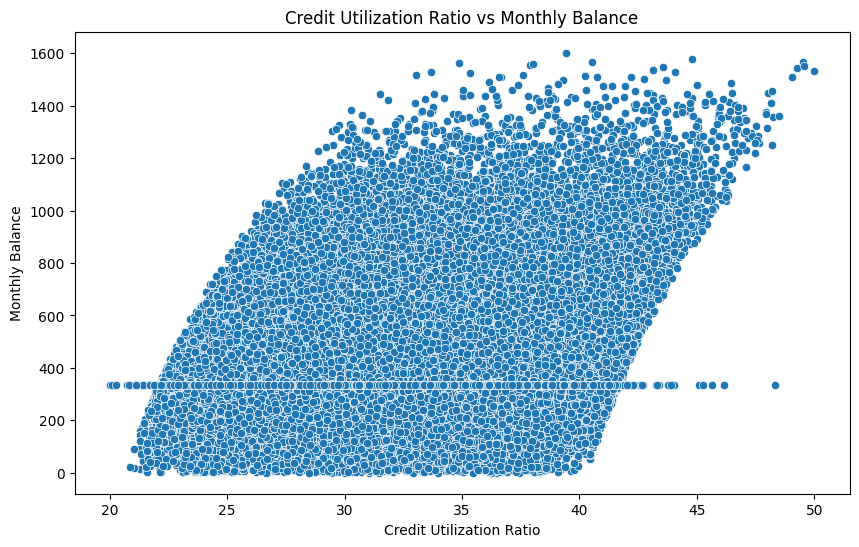

In [26]:
# Plot: Credit Utilization Ratio vs Monthly Balance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Credit_Utilization_Ratio', y='Monthly_Balance', data=data)
plt.title('Credit Utilization Ratio vs Monthly Balance')
plt.xlabel('Credit Utilization Ratio')
plt.ylabel('Monthly Balance')
plt.show()


**Insights:**
The data presents an interesting relationship between monthly balance and credit utilization ratio:

* **Monthly Balance ₹0-1,000:** For individuals with a monthly balance ranging from ₹0 to ₹1,000, the credit utilization ratio lies between 21% and 43%. This suggests that those with lower savings or available balances tend to maintain a moderate credit utilization, indicating careful credit management to avoid overextending themselves financially.
* **Monthly Balance ₹1,000-1,200:** In this range, the credit utilization ratio slightly increases to between 23% and 44%. This slight uptick may suggest that individuals with a slightly higher monthly balance feel more comfortable using a bit more of their available credit, yet they still maintain control over their credit usage.
* **Monthly Balance ₹1,400-1,600:** For individuals with a monthly balance of ₹1,400 to ₹1,600, the credit utilization ratio spreads more loosely, ranging from 30% to 48%. This broader range indicates that as monthly balances increase, individuals may exhibit more varied credit behaviors. Some may take on more credit due to perceived financial security, leading to a higher utilization ratio.

**Overall Insight:**
As monthly balance increases, the credit utilization ratio shows a tendency to slightly rise and spread more broadly. This suggests that individuals with higher balances may feel more financially secure and therefore more willing to utilize a larger portion of their available credit. However, this also introduces more variability in credit behavior, reflecting different financial strategies among those with higher balances. While some maintain cautious credit usage, others may push closer to higher utilization ratios, possibly taking on more risk. This highlights the importance of continued prudent credit management, even as financial resources grow.








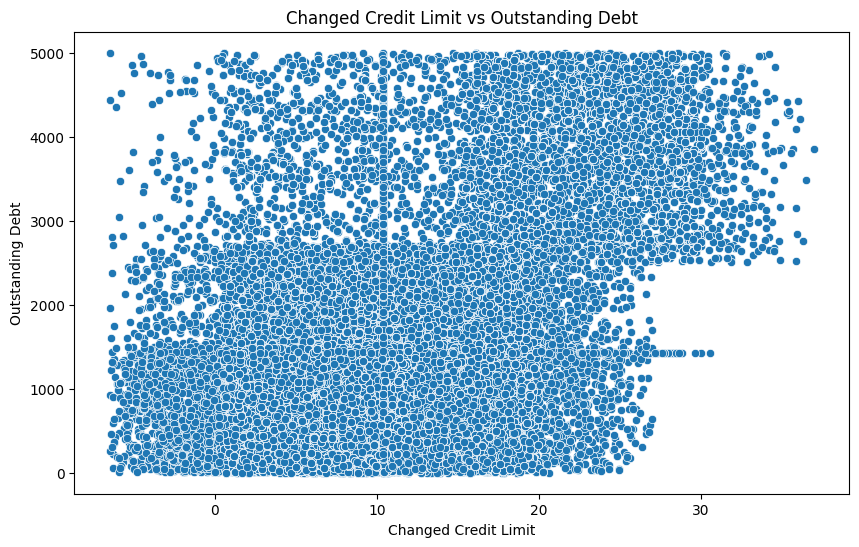

In [27]:
# Plot: Changed Credit Limit vs Outstanding Debt
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Changed_Credit_Limit', y='Outstanding_Debt', data=data)
plt.title('Changed Credit Limit vs Outstanding Debt')
plt.xlabel('Changed Credit Limit')
plt.ylabel('Outstanding Debt')
plt.show()

**Insights:**The relationship between outstanding debt and changed credit limit offers some valuable insights:

* **Outstanding Debt ₹0-3,000:** When outstanding debt is between ₹0 and ₹3,000, the changed credit limit is minimal or non-existent. This suggests that individuals with lower levels of debt are less likely to see significant changes in their credit limit. It could indicate that lenders do not find it necessary to adjust credit limits when debt levels are low, possibly because these individuals are perceived as lower risk.
* **Outstanding Debt ₹3,000-5,000:** As outstanding debt increases to between ₹3,000 and ₹5,000, the changed credit limit lies mostly between 15% and 35%. This indicates that as debt levels rise, lenders may be more inclined to adjust the credit limits, either by increasing them to provide more flexibility or decreasing them to mitigate risk. The range suggests variability in how lenders respond to higher debt levels, possibly depending on the borrower’s overall credit profile.

**Overall Insight:**
The data shows a correlation between outstanding debt levels and changes in credit limits. For individuals with low outstanding debt (₹0-3,000), credit limits tend to remain stable. However, as debt increases (₹3,000-5,000), there is a noticeable adjustment in credit limits, ranging from 15% to 35%. This trend suggests that lenders actively manage credit limits based on outstanding debt, with more significant changes occurring as debt increases. It highlights how debt levels can influence lender behavior, impacting the flexibility or restrictions placed on borrowers' credit access.

<ipython-input-31-b27c156ede52>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Payment_Behaviour', y='Annual_Income', data=data, ci=None, palette="muted")
<ipython-input-31-b27c156ede52>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Payment_Behaviour', y='Annual_Income', data=data, ci=None, palette="muted")


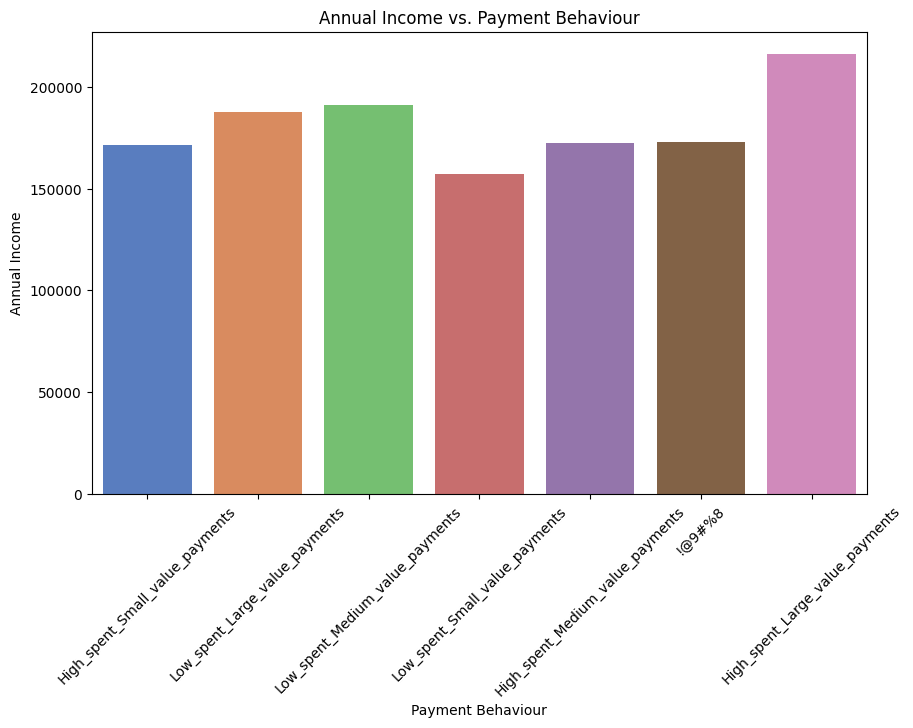

In [31]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Payment_Behaviour', y='Annual_Income', data=data, ci=None, palette="muted")
plt.title('Annual Income vs. Payment Behaviour')
plt.xticks(rotation=45)
plt.ylabel('Annual Income')
plt.xlabel('Payment Behaviour')
plt.show()


In [32]:
data['Payment_Behaviour'].value_counts()

,count
Payment_Behaviour,
Low_spent_Small_value_payments,25513
High_spent_Medium_value_payments,17540
Low_spent_Medium_value_payments,13861
High_spent_Large_value_payments,13721
High_spent_Small_value_payments,11340
Low_spent_Large_value_payments,10425
!@9#%8,7600


**Insights:**

* **Highest Annual Income:** The highest annual income of approximately ₹230,000 is associated with the payment behavior of "high spent large value payments." This suggests that individuals with the highest income tend to spend more on large value payments.
High Spenders Across Payment Sizes:

* **For other high-spending behaviors:**
     * High spent medium value payments have a maximum annual income of approximately ₹170,000.
     * High spent small value payments also have a maximum annual income of approximately ₹170,000.
     * The pattern indicates that while those who spend large amounts have the highest income, those who spend medium and small amounts still have significant, but lower, incomes.
* **Low Spenders Across Payment Sizes:**
   * For lower spending behaviors:
Low spent large value payments correspond to a maximum income of approximately ₹180,000.
Low spent medium value payments have a maximum income of approximately ₹185,000.
Low spent small value payments have a maximum income of approximately ₹150,000.
These insights suggest that even with lower spending on large value items, the maximum income remains relatively high, but not as high as those who are high spenders.
* **Irregular or Invalid Payment Behavior:**
The presence of irregular payment behavior like "!@9#%8" (which seems like a data entry error or invalid category) shows a maximum salary of ₹170,000. This might indicate that individuals with such irregularities are earning significant incomes, but this could be an outlier or error.


**Strategic Recommendations:**
* **Segmentation of High Earners:**
The significant difference in income between high spenders on large value payments and other categories suggests the need to segment customers based on their spending behavior and target them with tailored financial products or services. High-income customers who spend large amounts may be more open to premium financial services.
* **Error Handling and Data Cleaning:**
The irregular payment behavior "!@9#%8" indicates a need for better data validation and cleaning processes. This category should be reviewed and corrected to ensure the accuracy of insights and strategies.
Focus on Medium Spenders:

* Customers with "high spent medium value payments" and "low spent large/medium value payments" still have substantial incomes. Targeting these segments with appropriate credit products or investment opportunities could be beneficial.
Behavioral Analysis:

* Further analysis could be conducted to see if there's a correlation between spending behavior and other factors like credit score, debt levels, or loan types. This could help refine strategies for customer engagement and risk management.

<ipython-input-34-2c122b3267c3>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Payment_Behaviour', y='Age', data=data, palette="muted")


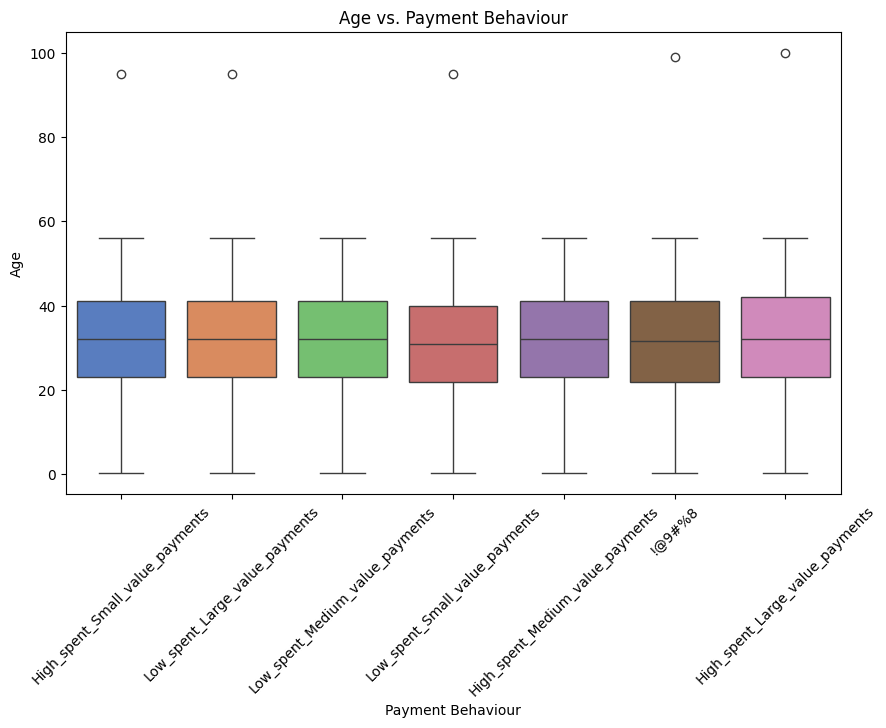

In [34]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Payment_Behaviour', y='Age', data=data, palette="muted")
plt.title('Age vs. Payment Behaviour')
plt.xticks(rotation=45)
plt.ylabel('Age')
plt.xlabel('Payment Behaviour')
plt.show()


**Insights:**
The data reveals that across all payment behaviors, the age group consistently falls between 22 to 40 years. This indicates that the majority of customers, regardless of their spending and payment patterns, belong to a relatively young and middle-aged demographic. This uniformity suggests that age might not be a distinguishing factor in predicting payment behavior, with customers in this age range exhibiting a wide variety of spending habits.

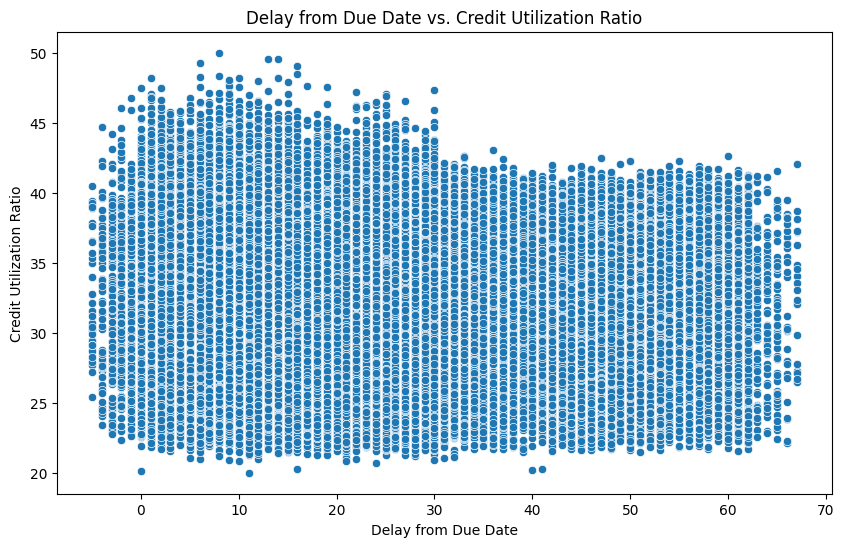

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Delay_from_due_date', y='Credit_Utilization_Ratio', data=data)
plt.title('Delay from Due Date vs. Credit Utilization Ratio')
plt.ylabel('Credit Utilization Ratio')
plt.xlabel('Delay from Due Date')
plt.show()

**Insights:**
* The analysis shows that for customers with a payment delay ranging from 0 to 30 days, the credit utilization ratio typically falls between 22% and 50%.

* However, as the delay increases to 31-68 days, the credit utilization ratio decreases, ranging from 22% to 42%.
* This trend suggests that customers with longer payment delays tend to have lower credit utilization ratios, possibly indicating more cautious or reduced credit usage as their payment delays increase. It could also imply that higher credit utilization might correlate with better payment discipline, at least within the shorter delay window.

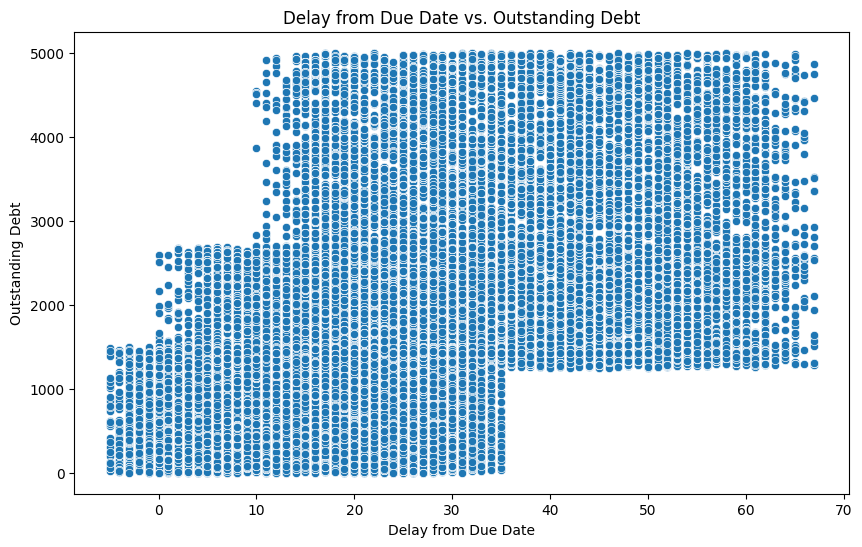

In [37]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Delay_from_due_date', y='Outstanding_Debt', data=data)
plt.title('Delay from Due Date vs. Outstanding Debt')
plt.ylabel('Outstanding Debt')
plt.xlabel('Delay from Due Date')
plt.show()

**Insights:**
The analysis reveals a clear pattern between payment delays and outstanding debt amounts:

* **0 Days Delay:** Customers who make payments on time (0 days delay) typically have lower outstanding debt, ranging from $0 to $1,500. This suggests that timely payers are likely managing their debt more effectively or have smaller amounts of debt to begin with.

* **1-12 Days Delay:** For customers with a slight delay in payments (1-12 days), the range of outstanding debt increases significantly, from $0 to $2,800. This indicates that even a minor delay might be associated with higher levels of debt.

* **12-35 Days Delay:** As the delay extends to 12-35 days, the outstanding debt further increases, ranging from $0 to $5,000. This trend shows that customers who delay payments for longer periods tend to accumulate more debt, which might indicate financial strain or poor debt management.

* **36-68 Days Delay:** Interestingly, for delays of 36-68 days, while the lower bound of outstanding debt increases to 1,200, the upper bound remains at $5,000. This suggests that while customers with longer delays still have significant outstanding debt, the maximum debt amount doesn't increase further, potentially indicating a ceiling effect where debt levels stabilize despite increasing delays.

Overall, the insights suggest that as payment delays increase, so does the range of outstanding debt, reflecting a possible correlation between delayed payments and financial challenges.


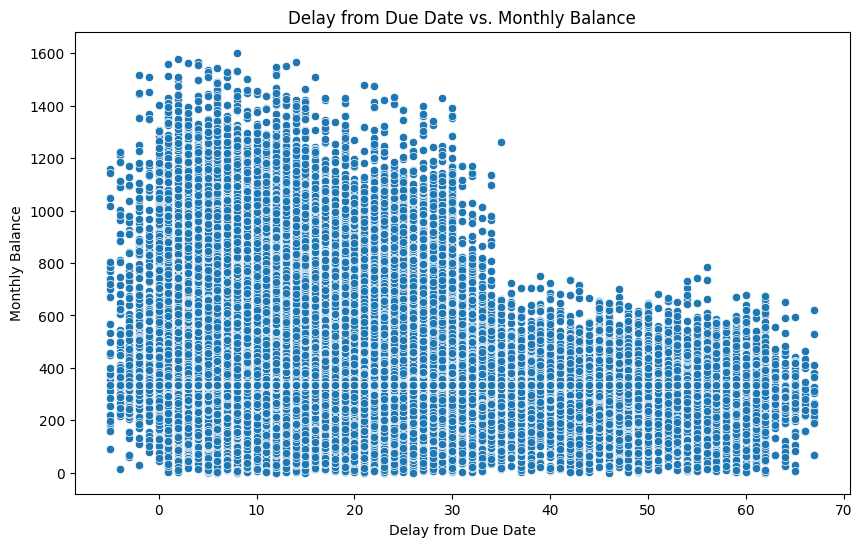

In [38]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Delay_from_due_date', y='Monthly_Balance', data=data)
plt.title('Delay from Due Date vs. Monthly Balance')
plt.ylabel('Monthly Balance')
plt.xlabel('Delay from Due Date')
plt.show()

**Insights:**

* **0-32 Days Delay:**

  * Monthly balances range from 150 to 1600.
  * Higher Range: This suggests that customers with shorter payment delays (0-32 days) can have a wide range of monthly balances, with some maintaining high balances and others with lower balances.
  * Potential for Higher Balances: The presence of high balances (up to 1600) indicates that even those with slight delays might have significant financial capacity or higher usage.
* **33-68 Days Delay:**

  * Monthly balances range from 150 to 800.
  * Lower Range: The maximum balance is lower compared to the 0-32 days delay category. This indicates that customers with more significant delays tend to have lower monthly balances overall.
  * Reduced Capacity: Lower monthly balances in this category might suggest reduced financial capacity or increased financial strain.
* **Financial Implications:**

  * Payment Delays and Balances: Customers with longer payment delays (33-68 days) tend to have lower monthly balances. This may indicate that delayed payments are associated with lower financial resources or increased financial difficulties.
  * Financial Stress: The reduction in maximum balance for those with longer delays could imply that these customers are experiencing more financial stress, possibly affecting their ability to maintain higher balances.
* **Risk Indicators:**

  * Short Delay Customers: Customers with shorter delays (0-32 days) who have high monthly balances might still be considered less financially stressed, but their ability to manage payments could be inconsistent.
  * Long Delay Customers: Those with longer delays (33-68 days) and lower balances might be at higher risk of financial instability or default, as their reduced balances suggest less financial flexibility.

**Recommendations**
* **Segment Analysis:**

  * Short Delay Segment: For customers with short payment delays but high monthly balances, monitor their payment behavior closely. They might need additional support or financial management tools to avoid future delays.
  * Long Delay Segment: For customers with longer delays and lower balances, consider implementing targeted financial assistance or intervention programs to address their financial challenges.
* **Financial Support Programs:**

  * Debt Management: Offer debt management programs or financial counseling to customers with longer payment delays to help them improve their financial situation and avoid future payment issues.
  * Personalized Offers: Develop tailored financial products or support based on the customer’s payment delay and balance status. For example, offer lower interest rates or extended payment terms to high-balance customers with short delays.
* **Risk Management:**

  * Early Intervention: Implement early intervention strategies for customers who show signs of financial stress or increasing payment delays. This can help mitigate potential risks before they escalate.
  * Monitor Balances: Regularly monitor the monthly balances and payment delays to identify trends and adjust risk management strategies accordingly.
* **Customer Education:**

  * Financial Literacy: Provide educational resources to help customers understand the impact of payment delays on their financial health and encourage timely payments.
  * Budgeting Tools: Offer tools and resources to help customers manage their budgets more effectively and avoid delays in payments.
* **Data Analysis:**

  * Trend Analysis: Continue analyzing trends in payment delays and monthly balances to refine your understanding of customer behavior and risk profiles.
  * Additional Metrics: Consider analyzing additional metrics, such as income levels or expenditure patterns, to gain a more comprehensive view of financial health.

**Summary:**
* Short Delay Customers: Higher monthly balances but varied levels of financial capacity. Monitor and support as needed.
* Long Delay Customers: Lower monthly balances with potentially higher financial strain. Implement targeted support and intervention strategies.

By leveraging these insights, you can better manage customer risk, offer appropriate financial support, and improve overall financial stability for your customer base.

In [40]:
data1=data

**2. FEATURE ENGINEERING:**

In [42]:
# Feature 1: Debt-to-Income Ratio
data['Debt_to_Income_Ratio'] = data['Outstanding_Debt'] / data['Annual_Income']

# Feature 2: Credit  History Age (in years)

# Feature 3: Average Payment Delay
data['Average_Payment_Delay'] = data['Delay_from_due_date'] * data['Num_of_Delayed_Payment'].astype(int)

# Aggregating Data at the Customer Level
customer_level_data = data.groupby('Customer_ID').agg({
    'Debt_to_Income_Ratio': 'mean',
    'Credit_History_Age': 'mean',
    'Average_Payment_Delay': 'mean',
    'Credit_Utilization_Ratio': 'mean',
    'Num_Credit_Inquiries': 'sum',
    'Num_of_Loan': 'sum'
}).reset_index()

# Calculating the Credit Score (Hypothetical)
customer_level_data['Credit_Score'] = (
    0.35 * (1 - customer_level_data['Average_Payment_Delay']/365) +
    0.30 * (1 - customer_level_data['Debt_to_Income_Ratio']) +
    0.15 * customer_level_data['Credit_History_Age'] +
    0.10 * (1 - customer_level_data['Num_Credit_Inquiries']/10) +
    0.10 * (customer_level_data['Credit_Utilization_Ratio'])
)

# Scaling the Credit Score to a 300-850 range
customer_level_data['Credit_Score'] = 300 + 550 * (customer_level_data['Credit_Score'] - customer_level_data['Credit_Score'].min()) / (customer_level_data['Credit_Score'].max() - customer_level_data['Credit_Score'].min())

# Display the first few rows of the aggregated data
print(customer_level_data.head())


  Customer_ID  Debt_to_Income_Ratio  Credit_History_Age  \
0  CUS_0x1000                  0.05               10.00   
1  CUS_0x1009                  0.01               28.62   
2  CUS_0x100b                  0.01               15.38   
3  CUS_0x1011                  0.01               15.00   
4  CUS_0x1013                  0.01               17.12   

   Average_Payment_Delay  Credit_Utilization_Ratio  Num_Credit_Inquiries  \
0                1555.62                     33.48                 87.00   
1                1860.50                     29.84                 24.00   
2                  99.75                     34.84                 40.33   
3                 381.75                     27.66                 76.33   
4                 114.00                     31.93                 24.00   

   Num_of_Loan  Credit_Score  
0        16.00        754.90  
1        29.56        793.79  
2         2.78        794.31  
3        24.00        774.65  
4        24.00        795.99  


In [44]:
data1['Month'] = pd.to_datetime(data1['Month'], format='%B')

In [45]:
# Last 3 months
last_3_months = data1[data1['Month'] >= data1['Month'].max() - pd.DateOffset(months=3)]

# Last 6 months
last_6_months = data1[data1['Month'] >= data1['Month'].max() - pd.DateOffset(months=6)]


In [46]:
def calculate_credit_score(df):
    df['Debt_to_Income_Ratio'] = df['Outstanding_Debt'] / df['Annual_Income']
    df['Average_Payment_Delay'] = df['Delay_from_due_date'] * df['Num_of_Delayed_Payment']

    customer_level_data1 = df.groupby('Customer_ID').agg({
        'Debt_to_Income_Ratio': 'mean',
        'Credit_History_Age': 'mean',
        'Average_Payment_Delay': 'mean',
        'Credit_Utilization_Ratio': 'mean',
        'Num_Credit_Inquiries': 'sum',
        'Num_of_Loan': 'sum'
    }).reset_index()

    customer_level_data1['Credit_Score'] = (
        0.35 * (1 - customer_level_data['Average_Payment_Delay'] / 365) +
        0.30 * (1 - customer_level_data['Debt_to_Income_Ratio']) +
        0.15 * customer_level_data['Credit_History_Age'] +
        0.10 * (1 - customer_level_data['Num_Credit_Inquiries'] / 10) +
        0.10 * customer_level_data['Credit_Utilization_Ratio']
    )

    customer_level_data1['Credit_Score'] = 300 + 550 * (
        customer_level_data1['Credit_Score'] - customer_level_data['Credit_Score'].min()) / (
        customer_level_data1['Credit_Score'].max() - customer_level_data['Credit_Score'].min())

    return customer_level_data1

last_3_months_scores = calculate_credit_score(last_3_months)
last_6_months_scores = calculate_credit_score(last_6_months)


<ipython-input-46-de4fef5082c4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Debt_to_Income_Ratio'] = df['Outstanding_Debt'] / df['Annual_Income']
<ipython-input-46-de4fef5082c4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Average_Payment_Delay'] = df['Delay_from_due_date'] * df['Num_of_Delayed_Payment']
<ipython-input-46-de4fef5082c4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

In [47]:
last_3_months_scores.head()

,Customer_ID,Debt_to_Income_Ratio,Credit_History_Age,Average_Payment_Delay,Credit_Utilization_Ratio,Num_Credit_Inquiries,Num_of_Loan,Credit_Score
0,CUS_0x1000,0.05,10.00,1533.25,35.16,44.00,8.00,862.89
1,CUS_0x1009,0.00,30.25,110.00,33.81,16.00,16.00,857.62
2,CUS_0x100b,0.01,15.00,85.75,32.48,10.00,2.78,857.55
3,CUS_0x1011,0.01,15.00,392.25,27.58,48.33,12.00,860.21
4,CUS_0x1013,0.01,17.25,117.00,33.09,12.00,12.00,857.32


In [48]:
last_6_months_scores.head()

,Customer_ID,Debt_to_Income_Ratio,Credit_History_Age,Average_Payment_Delay,Credit_Utilization_Ratio,Num_Credit_Inquiries,Num_of_Loan,Credit_Score
0,CUS_0x1000,0.04,10.00,1556.43,34.46,77.00,14.00,862.89
1,CUS_0x1009,0.01,28.43,127.43,30.72,22.00,25.56,857.62
2,CUS_0x100b,0.01,15.43,100.00,34.39,39.33,2.78,857.55
3,CUS_0x1011,0.01,15.00,390.00,27.68,69.33,21.00,860.21
4,CUS_0x1013,0.01,17.14,114.86,30.51,21.00,21.00,857.32


**Key factors influencing credit worthiness**

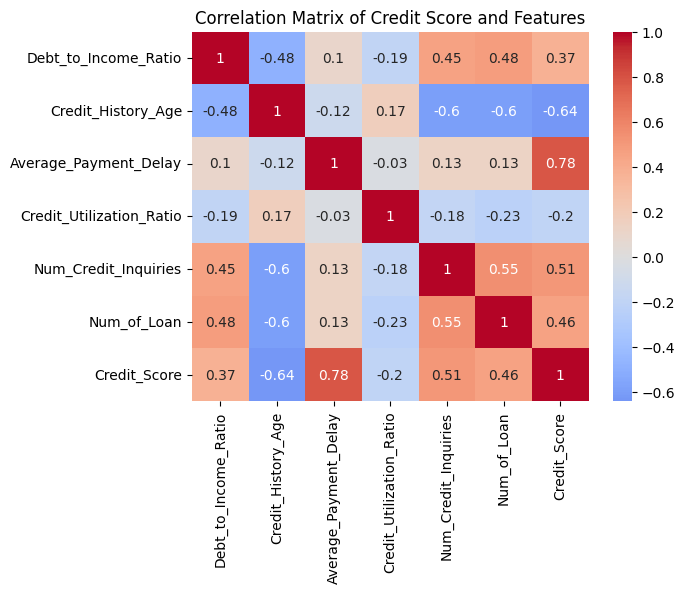

In [50]:
# Exclude non-numeric columns like 'Customer_ID'
numeric_columns = last_6_months_scores.select_dtypes(include=[np.number])

# Calculate the correlation matrix
correlation_matrix = round(numeric_columns.corr(), 2)

# Plot the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Credit Score and Features')
plt.show()


**Insights:**Based on the correlation matrix, here are the insights and factors influencing creditworthiness:

* **Debt-to-Income Ratio (DTI) and Credit Score:** A higher debt-to-income ratio is strongly correlated with a lower credit score. This suggests that as individuals' debt relative to their income increases, their credit score tends to decrease.
* **Debt-to-Income Ratio and Number of Loans:** There's a positive correlation between the debt-to-income ratio and the number of loans. This indicates that individuals with a higher DTI are more likely to have multiple loans.
* **Debt-to-Income Ratio and Number of Credit Inquiries:** A positive correlation exists between the DTI and the number of credit inquiries. This implies that individuals with higher DTI ratios are likely to make more inquiries for credit, possibly indicating financial stress or a need for additional credit.
* **Average Payment Delay and Credit Score:** The average payment delay is positively correlated with the credit score, meaning that longer payment delays are associated with lower credit scores. This highlights the importance of timely payments in maintaining a good credit score.
* **Number of Credit Inquiries and Credit Score:** A strong negative correlation between the number of credit inquiries and the credit score suggests that frequent credit inquiries can harm an individual's credit score, possibly reflecting a higher credit risk.
* **Number of Credit Inquiries and Number of Loans:** A positive correlation between credit inquiries and the number of loans indicates that those who frequently inquire about credit are more likely to have multiple loans.
* **Number of Loans and Credit Score:** The number of loans is negatively correlated with the credit score, indicating that individuals with multiple loans tend to have lower credit scores.
* **Debt-to-Income Ratio and Credit History Age:** There is a significant negative correlation between the debt-to-income ratio and the credit history age. Individuals with longer credit histories tend to have lower DTI ratios, possibly due to better financial management or higher income stability over time.
* **Credit History Age and Number of Inquiries:**
A negative correlation suggests that those with longer credit histories tend to have fewer credit inquiries, which could indicate financial stability and reduced need for new credit.
* **Credit History Age and Number of Loans:** A negative correlation between credit history age and the number of loans indicates that individuals with longer credit histories might be more selective or cautious about taking on new loans.
* **Credit History Age and Credit Score:** A positive correlation indicates that longer credit histories are associated with higher credit scores, reinforcing the value of maintaining a long and positive credit history.

**3. Factors Influencing Creditworthiness:**

* **Debt-to-Income Ratio (DTI):** High DTI ratios negatively impact creditworthiness as they indicate a high level of debt relative to income, increasing the risk of default.
* **Credit History Age:** Longer credit history positively influences creditworthiness, as it demonstrates the borrower’s experience in managing credit over time.
* **Number of Credit Inquiries:** Frequent credit inquiries can indicate financial instability or desperation for credit, negatively impacting creditworthiness.
* **Number of Loans:**
A higher number of loans can suggest overleveraging, which negatively affects creditworthiness.
* **Payment Behavior:** Consistent delays in payment reduce creditworthiness by indicating the borrower’s inability or unwillingness to meet payment obligations.
* **Credit Utilization:** High credit utilization ratios signal a high dependence on credit, which can lower creditworthiness.
* **Outstanding Debt:** Large amounts of outstanding debt relative to income and credit history can significantly lower creditworthiness.

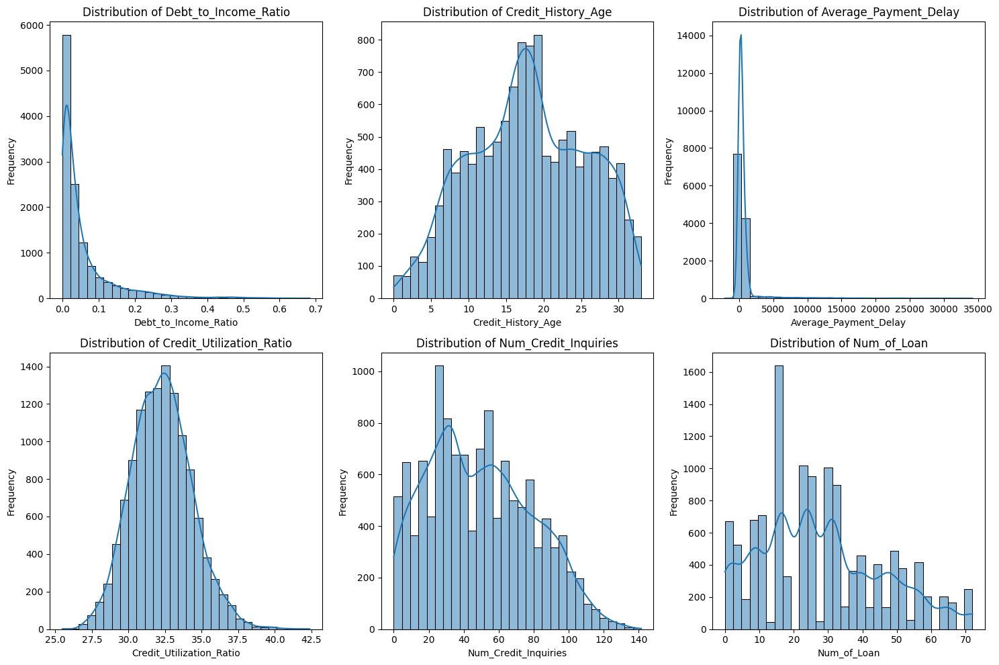

In [51]:
# List of features to visualize
features = ['Debt_to_Income_Ratio', 'Credit_History_Age', 'Average_Payment_Delay',
            'Credit_Utilization_Ratio', 'Num_Credit_Inquiries', 'Num_of_Loan']

# Plotting histograms
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    sns.histplot(customer_level_data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**Insights:**

* **DTI Ratio Distribution:**

   * Right-Skewed Distribution: Most of your customers have a low DTI ratio, indicating that the majority of your customer base has relatively low levels of debt compared to their income.
   * Range: With DTI ratios mainly ranging from 0 to 0.2, this suggests that the debt levels are manageable for most customers, aligning with a low-risk profile.
* **Debt Burden:**

   * Low Debt Burden: The low DTI ratios imply that customers are not overly burdened by debt relative to their income. This generally signifies lower financial stress and a lower likelihood of default.
   * Outliers: Customers with higher DTI ratios (though they may be few) could be at higher risk. These outliers, if any, might indicate financial strain or higher risk of default.
* **Credit Risk Assessment:**

   * Low-Risk Profile: The predominance of low DTI ratios supports a low-risk profile for most customers. This complements the earlier insight about credit scores being high and aligns with lower default rates.

**Recommendations**
* **Segment Analysis:**

   * Low DTI Segment: Continue to monitor and support customers with low DTI ratios. Consider offering financial products that cater to their low-risk status, such as premium services or higher credit limits.
   * High DTI Segment: Identify and provide targeted support for customers with higher DTI ratios. They might benefit from financial counseling, debt management plans, or consolidation options.
* **Debt Management Strategies:**

   * Educational Programs: Offer financial education programs to help customers understand and manage their DTI ratios effectively. This can prevent them from reaching higher debt burdens.
   * Debt Reduction Tools: Provide tools or resources to help customers reduce their debt levels and manage their finances better.
* **Credit Risk Modeling:**

   * Incorporate DTI Ratios: Integrate DTI ratios into your credit risk models to enhance predictions of default risk. Given that the DTI ratio is right-skewed, consider using models that handle skewed distributions well.
  * Monitor Trends: Regularly review changes in DTI ratios over time to detect any emerging trends or shifts in customer debt levels.


* **Personalized Offers:** Develop personalized financial products or interventions for customers with higher DTI ratios, such as tailored repayment plans or debt restructuring options.
* **Proactive Measures:** Implement proactive measures to prevent customers from moving into higher DTI ranges, such as early intervention programs or financial wellness checks.

**Summary:**
* Low DTI Ratios: Most customers have a low DTI ratio, indicating a low debt burden and lower financial risk.
* High DTI Ratios: Focus on customers with higher DTI ratios for targeted support and interventions.
* Model Adjustment: Incorporate DTI ratios into your risk models and consider data transformations if needed.
By leveraging these insights and recommendations, you can better manage credit risk, support your customers more effectively, and enhance overall financial strategies.

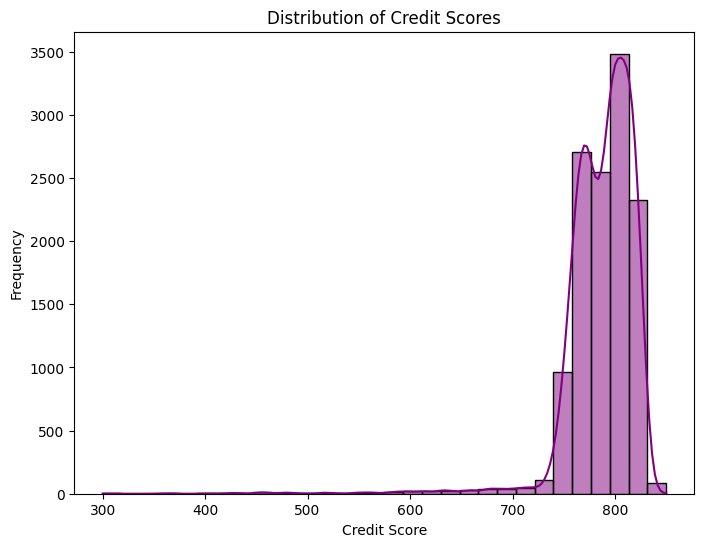

In [52]:
plt.figure(figsize=(8, 6))
sns.histplot(customer_level_data['Credit_Score'], kde=True, bins=30, color='purple')
plt.title('Distribution of Credit Scores')
plt.xlabel('Credit Score')
plt.ylabel('Frequency')
plt.show()


**Insights:**

**Credit Score Distribution:**

* **Left-Skewed Distribution:** The majority of credit scores are high, with a concentration between 720 and 800. This suggests that most customers in your dataset have strong credit scores.
* **Concentration:** A high concentration in this range indicates that a large proportion of customers are considered low-risk, assuming higher credit scores generally correlate with lower risk.

**Risk Profile:**

* **Low Risk Majority:** The bulk of your customers have high credit scores, which typically implies lower risk of default. This can be advantageous for financial institutions as it suggests a generally healthy customer base.
Potential Outliers: Customers with credit scores significantly below 720 may represent higher risk and could be a smaller, but more critical, segment to focus on.


**Default Rates:**

* **High Score Impact:** Given that high credit scores are associated with lower default rates, your earlier hypothesis test results are supported. This concentration of high scores aligns with the significant difference in default rates observed between high and low credit score groups.
Credit Utilization:

* **Correlation Insights:** If there’s a significant correlation between credit utilization and credit score, customers with high credit utilization may have lower credit scores, even if most scores are high. This can provide insights into credit behavior and potential areas of risk.
Recommendations
Segment Analysis:

* **High Score Segment:** Focus on maintaining and nurturing the high credit score segment. Offer rewards, loyalty programs, or special incentives to retain these low-risk customers.
* **Low Score Segment:** Implement targeted strategies for customers with lower credit scores. Develop customized financial products or support programs to improve their credit profiles and reduce the risk of default.
Credit Score Monitoring:

* **Regular Review:** Continuously monitor credit scores to identify any shifts or trends, especially if the high concentration in the 720-800 range changes over time. This can help in proactive risk management.

**Customer Education:**

Improve Credit Utilization: Educate customers on managing credit utilization to maintain or improve their credit scores. Offer tools and resources to help customers better understand and manage their credit utilization ratios.
Financial Literacy: Enhance financial literacy programs to help customers understand the importance of maintaining a good credit score and how to achieve it.



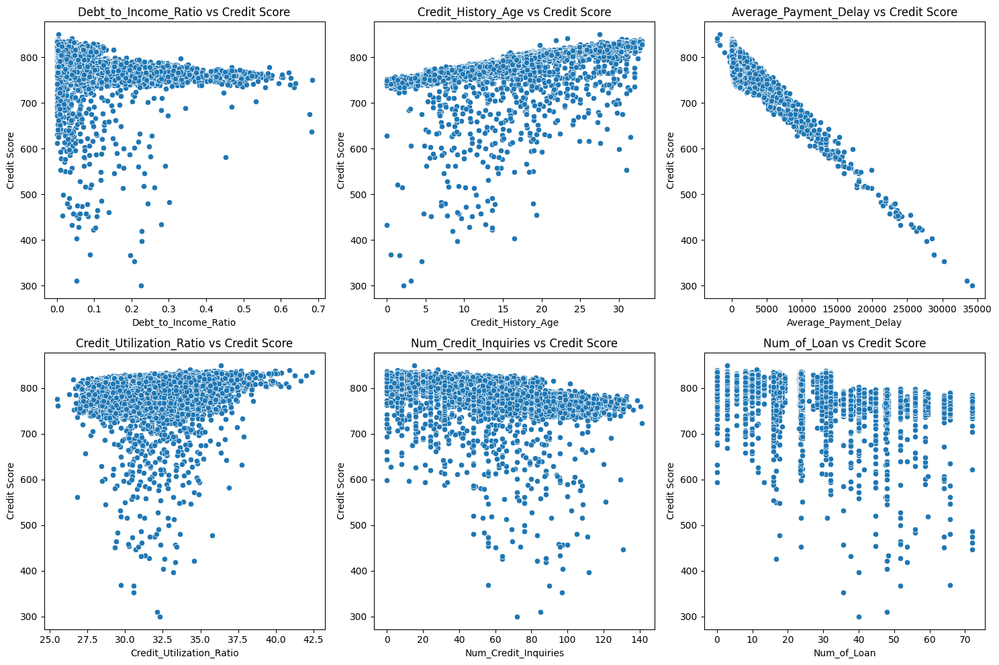

In [53]:
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    sns.scatterplot(x=customer_level_data[feature], y=customer_level_data['Credit_Score'])
    plt.title(f'{feature} vs Credit Score')
    plt.xlabel(feature)
    plt.ylabel('Credit Score')
plt.tight_layout()
plt.show()


In [58]:
customer_level_data['Default'] = customer_level_data['Average_Payment_Delay'] >= 60

**3. HYPOTHESIS TESTING**
We will use the credit scores calculated in your code for the following hypothesis tests:

* **Test the Relationship between Credit Scores and Defaults:**
If you have a column indicating whether a customer has defaulted or not, you can test if customers with higher credit scores tend to have lower default rates.

* **Test the Distribution of Credit Scores:**
Check if the credit scores follow a normal distribution using the Shapiro-Wilk test.

* **Test the Influence of Credit Utilization and Other Features on Credit Scores:**
Use correlation tests to see how strongly features like Credit Utilization Ratio, Debt-to-Income Ratio, etc., influence the credit score.


**Hypothesis Test 1:** Relationship between Credit Scores and Defaults
* **Null Hypothesis (H0):** There is no significant difference in the default rates between high and low credit score groups.

* **Alternate Hypothesis (H1):** There is a significant difference in the default rates between high and low credit score groups.

In [60]:
import scipy.stats as stats

# Hypothesis Test 1: T-test for the difference in default rates
high_score_group = customer_level_data[customer_level_data['Credit_Score'] > customer_level_data['Credit_Score'].median()]['Default']
low_score_group = customer_level_data[customer_level_data['Credit_Score'] <= customer_level_data['Credit_Score'].median()]['Default']

t_stat, p_value = stats.ttest_ind(high_score_group, low_score_group, equal_var=False)

print("Hypothesis Test 1:")
print("T-statistic:", t_stat)
print("P-value:", p_value)

# Conclusion
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in default rates between high and low credit score groups.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in default rates between high and low credit score groups.")


Hypothesis Test 1:
T-statistic: -47.035096129464726
P-value: 0.0
Reject the null hypothesis: There is a significant difference in default rates between high and low credit score groups.


**Insight:**

Customers with high credit scores have a significantly different default rate compared to those with low credit scores. This suggests that credit scores are a strong indicator of default risk, with higher credit scores likely associated with lower default rates.

**Recommendation:**

* **Risk Assessment:** Consider using credit scores as a key factor in assessing the risk of defaults. You may refine your credit scoring models or risk assessment strategies to better differentiate between high and low-risk customers.
* **Targeted Interventions:** Implement targeted interventions or credit management strategies for customers with lower credit scores to reduce default rates.

**Hypothesis Test 2:** Normality of Credit Scores
* **Null Hypothesis (H0):** The credit scores follow a normal distribution.

* **Alternate Hypothesis (H1):** The credit scores do not follow a normal distribution.

In [61]:
# Hypothesis Test 2: Shapiro-Wilk Test for normality
shapiro_test = stats.shapiro(customer_level_data['Credit_Score'])

print("\nHypothesis Test 2:")
print("Shapiro-Wilk Test Statistic:", shapiro_test[0])
print("P-value:", shapiro_test[1])

# Conclusion
if shapiro_test[1] < alpha:
    print("Reject the null hypothesis: The credit scores do not follow a normal distribution.")
else:
    print("Fail to reject the null hypothesis: The credit scores follow a normal distribution.")



Hypothesis Test 2:
Shapiro-Wilk Test Statistic: 0.7177381134517975
P-value: 1.4306091772182493e-89
Reject the null hypothesis: The credit scores do not follow a normal distribution.


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12500.
  res = hypotest_fun_out(*samples, **kwds)


**Insight:**

The distribution of credit scores is not normal, indicating skewness or kurtosis in the data. This non-normality can affect statistical assumptions and modeling approaches that rely on normality.

**Recommendation:**

* **Data Transformation:** We can consider applying transformations (e.g., log transformation) to the credit score data to achieve a more normal distribution, if necessary, for specific statistical methods or models.
* **Non-parametric Methods:** Use non-parametric statistical methods or models that do not assume normality for analyzing credit score-related data.

**Hypothesis Test 3:** Influence of Credit Utilization on Credit Score
* **Null Hypothesis (H0):** There is no linear relationship between credit utilization ratio and credit score.

* **Alternate Hypothesis (H1):** There is a significant linear relationship between credit utilization ratio and credit score.

In [62]:
# Hypothesis Test 3: Pearson Correlation for the relationship between credit utilization and credit score
correlation, p_value = stats.pearsonr(customer_level_data['Credit_Utilization_Ratio'], customer_level_data['Credit_Score'])

print("\nHypothesis Test 3:")
print("Correlation Coefficient:", correlation)
print("P-value:", p_value)

# Conclusion
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant linear relationship between credit utilization ratio and credit score.")
else:
    print("Fail to reject the null hypothesis: There is no significant linear relationship between credit utilization ratio and credit score.")



Hypothesis Test 3:
Correlation Coefficient: 0.21340930579403
P-value: 1.0461659568852137e-128
Reject the null hypothesis: There is a significant linear relationship between credit utilization ratio and credit score.


**Insight:**

If the correlation is significant, it indicates a linear relationship between credit utilization and credit score, which could imply that higher credit utilization is associated with lower credit scores.

**Recommendation:**

* **Monitor Credit Utilization:** Keep track of credit utilization ratios, as they may impact credit scores. Implement strategies to manage and improve credit utilization for customers with high ratios.
* **Model Adjustment:** If a significant correlation is found, consider incorporating credit utilization ratios into your credit scoring or risk assessment models.

**Overall Recommendations:**
* **Refine Credit Risk Models:** Use the insights from these tests to refine your credit risk models. Incorporate the significant factors like credit score and credit utilization, and consider non-normality in your modeling approach.

* **Customer Management:** Develop strategies for customers based on their credit scores and utilization ratios to improve credit performance and reduce defaults.

By leveraging these insights, you can enhance your credit risk management practices and improve overall financial decision-making.








**4. FINAL INSIGHTS AND RECOMMENDATIONS:**

* **Monthly Inhand Salary and Financial Behavior:**

  * Monthly Balance: A positive upward trend is observed between monthly inhand salary and monthly balance. Higher earnings generally correspond with higher savings, indicating effective saving habits.
  * Amount Invested: Similarly, a positive relationship is evident between monthly salary and amount invested, suggesting increased earnings lead to greater investment behavior.
* **Credit History Age and Average Monthly Balance:**

  * 0-5 Years: Individuals in this category have a lower average balance (up to ₹1,000), likely indicating early stages of financial stability.

  * 5-15 Years: Average balances increase slightly to ₹1,000-₹1,100, reflecting improved financial management.
  * 15-35 Years: Significant rise in average balances (₹1,400-₹1,600) is seen, highlighting greater financial stability and savings among those with longer credit histories.
* **Credit History Age and Average Age of Individuals:**

  * 0-14 Years: Average age is around 50 years, suggesting that mid-life individuals may have shorter credit histories.
 * 15-34 Years: Average age rises to 58 years, indicating longer credit histories are associated with older individuals.
  * Extreme Cases: Some very old individuals maintain long credit histories, reflecting diverse financial behaviors across ages.
* **Monthly Inhand Salary and Credit History Age:**

  * 0-4 Years: Salary ranges from ₹600 to ₹7,000, suggesting early career stages.
  * 5-14 Years: Increases to ₹7,000-₹12,000, reflecting career advancement.
  * 15-34 Years: Salaries range from ₹12,000 to ₹16,000, indicating higher earnings with longer credit histories.
* **Monthly Balance and Credit Utilization Ratio:**

  * 0-1,000: Credit utilization ratio between 21%-43%, indicating moderate usage among those with lower balances.
  * 1,000-1,200: Ratio increases slightly to 23%-44%, showing more credit usage with higher balances.
  * 1,400-1,600: Ratio ranges from 30%-48%, with more variability in credit usage.
* **Outstanding Debt and Changed Credit Limit:**

  * 0-3,000 Debt: Minimal change in credit limit, indicating lower risk.
  * 3,000-5,000 Debt: Credit limit changes between 15%-35%, reflecting adjustments based on debt levels.
* **Annual Income and Spending Behavior:**

  * High Spent Large Value Payments: Highest income of approximately ₹230,000.
  * High Spent Medium/Small Value Payments: Maximum income around ₹170,000.
  * Low Spent Large/Medium Value Payments: Maximum incomes range from ₹150,000 to ₹185,000, indicating high incomes even with lower spending.
* **Payment Delays and Outstanding Debt:**

   * 0 Days Delay: Lower outstanding debt, indicating effective debt management.
   * 1-12 Days Delay: Increased debt, suggesting minor delays are associated with higher debt levels.
   * 12-35 Days Delay: Further increased debt, indicating greater financial strain.
   * 36-68 Days Delay: Debt amounts stabilize, suggesting a ceiling effect despite extended delays.
* **Monthly Balance and Payment Delays:**

   * 0-32 Days Delay: Wide range of balances (₹150-₹1,600), showing varied financial capacity.
  * 33-68 Days Delay: Lower maximum balances (up to ₹800), indicating reduced financial capacity.
* **Correlation Insights:**

  * Debt-to-Income Ratio (DTI) and Credit Score: Higher DTI is correlated with lower credit scores.
  * DTI and Number of Loans/Credit Inquiries: Higher DTI is linked with more loans and credit inquiries.
* **Average Payment Delay and Credit Score:**  Longer delays correlate with lower credit scores.
* **Credit History Age and Other Factors:** Longer histories are associated with lower DTI, fewer credit inquiries, and higher credit scores.


**Strategic Recommendations:**

* **Segment Analysis:**

  * High Earners: Target high-income segments with premium financial services.
  * Error Handling: Improve data validation and cleaning processes.
* **Behavioral Analysis:**

  * Short Delay Customers: Monitor and support those with short delays but high balances.
  * Long Delay Customers: Offer targeted financial assistance and intervention.
* **Financial Support Programs:**

  * Debt Management: Provide programs or counseling for those with significant delays.
  * Customer Education: Offer financial literacy and budgeting tools.
Risk Management:

  * Early Intervention: Address potential risks early with monitoring and targeted strategies.

By leveraging these insights, financial institutions can refine their strategies for managing risk, targeting customer segments, and providing appropriate support to improve financial stability and customer satisfaction.


**Factors Influencing Creditworthiness:**

* **Debt-to-Income Ratio (DTI):** High DTI ratios negatively impact creditworthiness as they indicate a high level of debt relative to income, increasing the risk of default.
* **Credit History Age:** Longer credit history positively influences creditworthiness, as it demonstrates the borrower’s experience in managing credit over time.
* **Number of Credit Inquiries:** Frequent credit inquiries can indicate financial instability or desperation for credit, negatively impacting creditworthiness.
* **Number of Loans:**
A higher number of loans can suggest overleveraging, which negatively affects creditworthiness.
* **Payment Behavior:** Consistent delays in payment reduce creditworthiness by indicating the borrower’s inability or unwillingness to meet payment obligations.
* **Credit Utilization:** High credit utilization ratios signal a high dependence on credit, which can lower creditworthiness.
* **Outstanding Debt:** Large amounts of outstanding debt relative to income and credit history can significantly lower creditworthiness.




